In [2]:
from __future__ import annotations
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from flamekit.io_fronts import Case, load_fronts


## Input Parameters

In [3]:
# -------------------------
# USER SETTINGS
# -------------------------
TIME_STEP = 230
PHI = 0.40
LAT_SIZE = "200"

ISOLEVELS = [3.0, 3.5, 4.4, 4.5, 4.6, 4.7]

BASE_DIR = Path("../isocontours")
POST = True

# If your Case supports these, set them here. If not, remove them.
MULTIPLE_RUNS = False
N_RUN = 2
SORET_TERM = False
SORET_POSITIVE = False

# Clustering (curvature-only)
N_CLUSTERS = 3
CLUSTER_FEATURE = "curvature"

# Sd column (excluded from PCA by default)
SD_COL = "DW_FDS"

# PCA per cluster
MAX_PCS_TO_PLOT = 10
TOP_LOADINGS = 12
MIN_SAMPLES_PER_CLUSTER_PCA = 200

# -------------------------
# PCA VARIABLE CONTROL
# -------------------------
PCA_FEATURE_MODE = "auto"   # "explicit" or "auto"

PCA_FEATURES_EXPLICIT = [
    # e.g. "curvature", "stretch_rate", "HRR", "gradT", "gradT_normal"
]

EXCLUDE_FROM_PCA = {
    "c_iso",
    "x",
    "y",
    "z",
    "N2",
    "omega_N2",

}


PCA_STANDARDIZE = True

Loaded 6 fronts from: ..\isocontours
Isolevels: [3.0, 3.5, 4.4, 4.5, 4.6, 4.7]
KMeans: 3 on [curvature]
PCA mode: auto
PCA excluded (auto): {'N2', 'omega_N2', 'c_iso', 'y', 'z', 'x'}


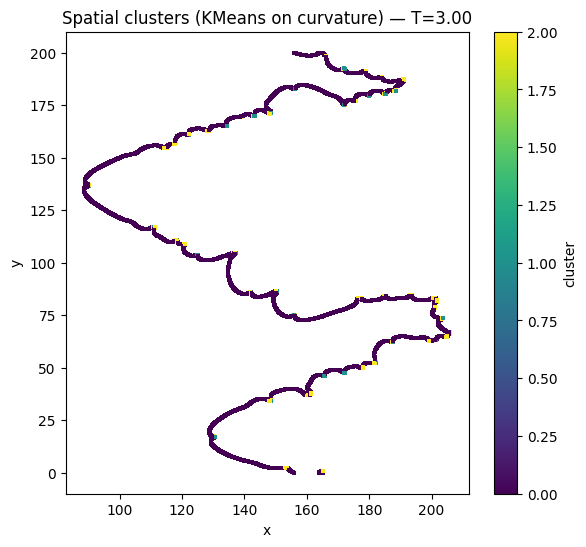

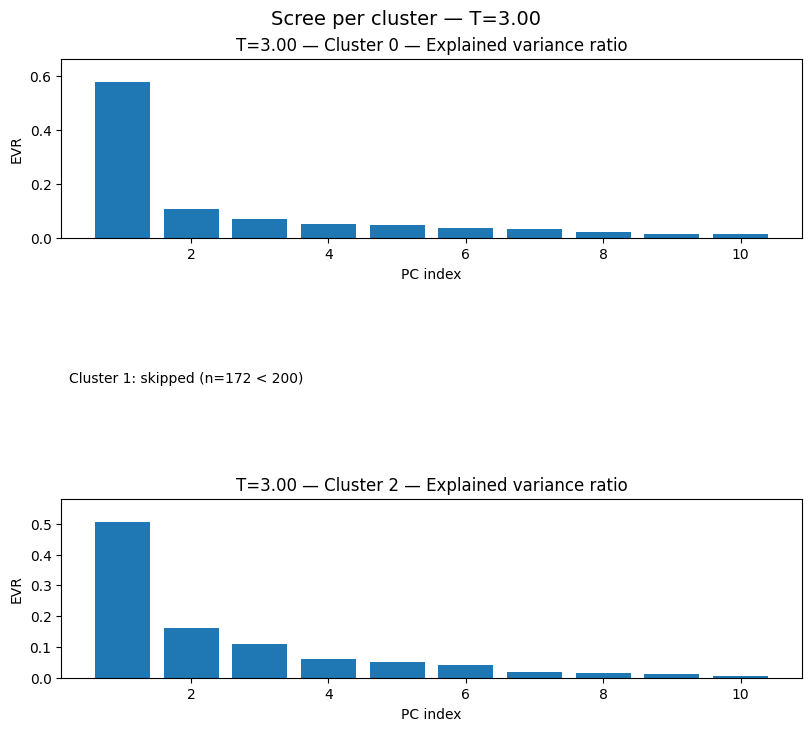

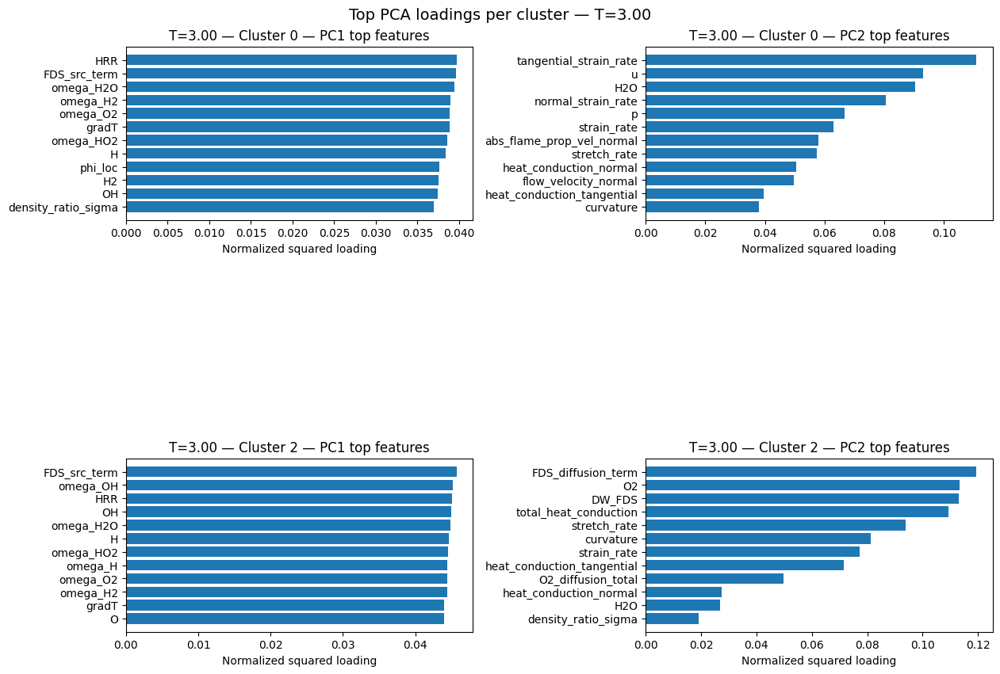

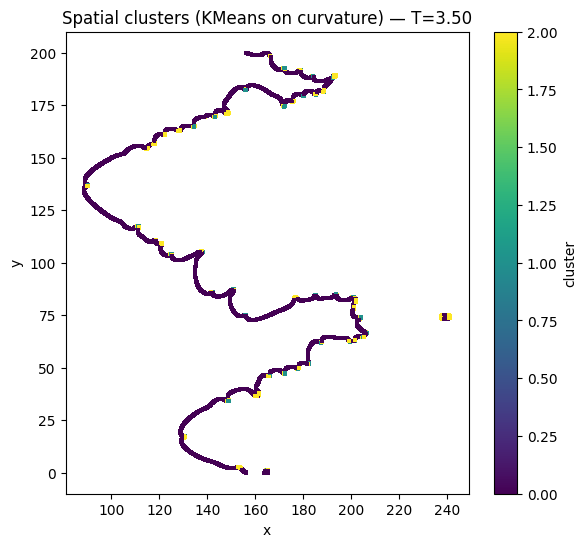

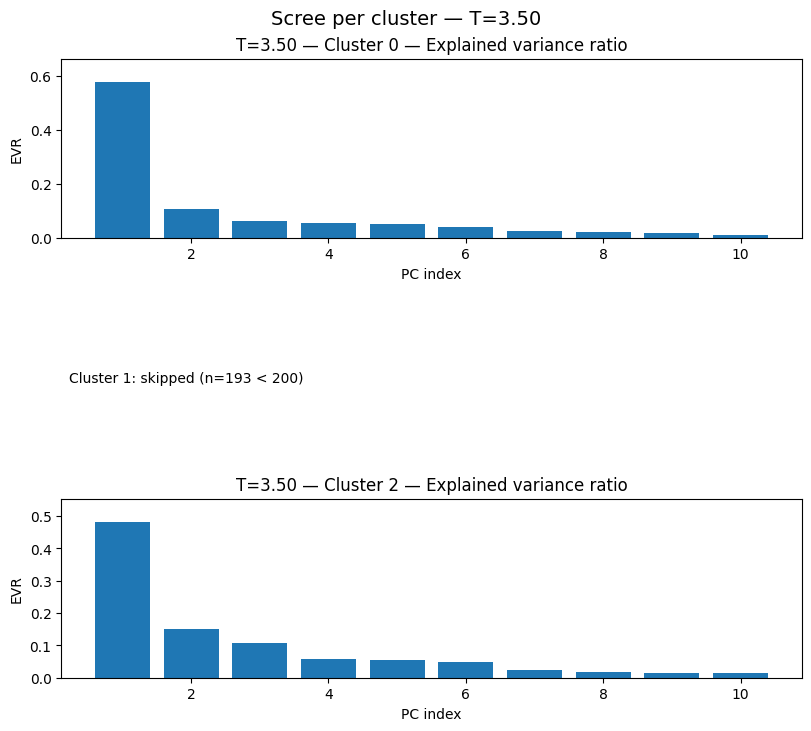

...

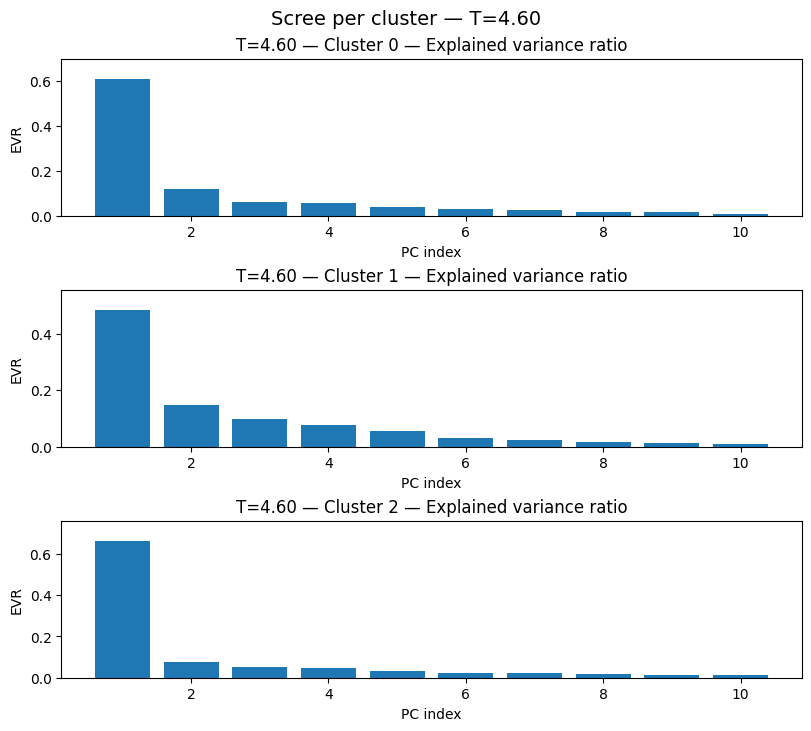

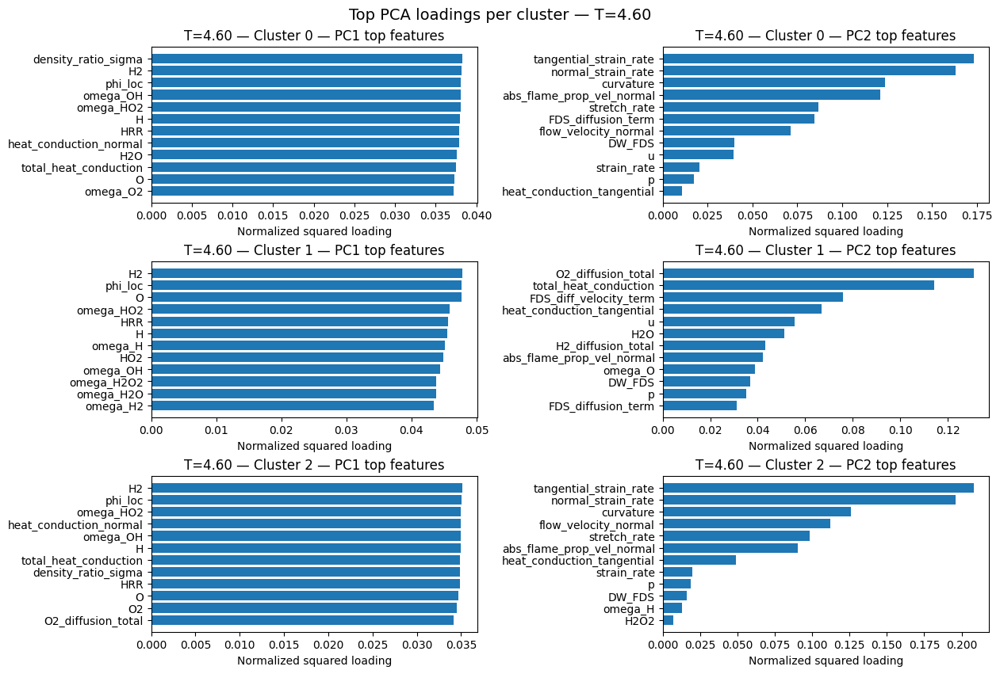

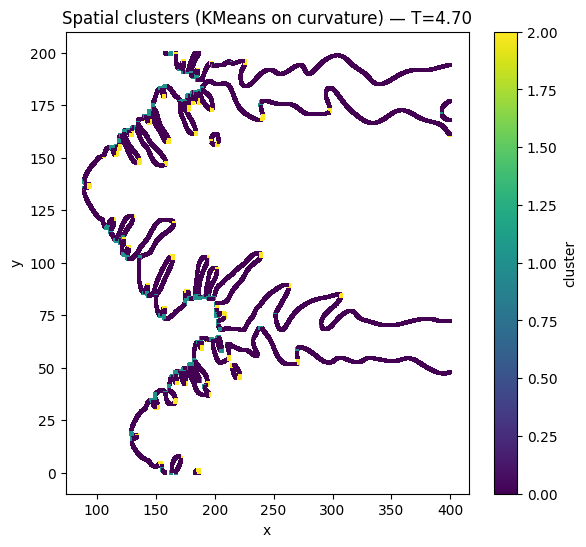

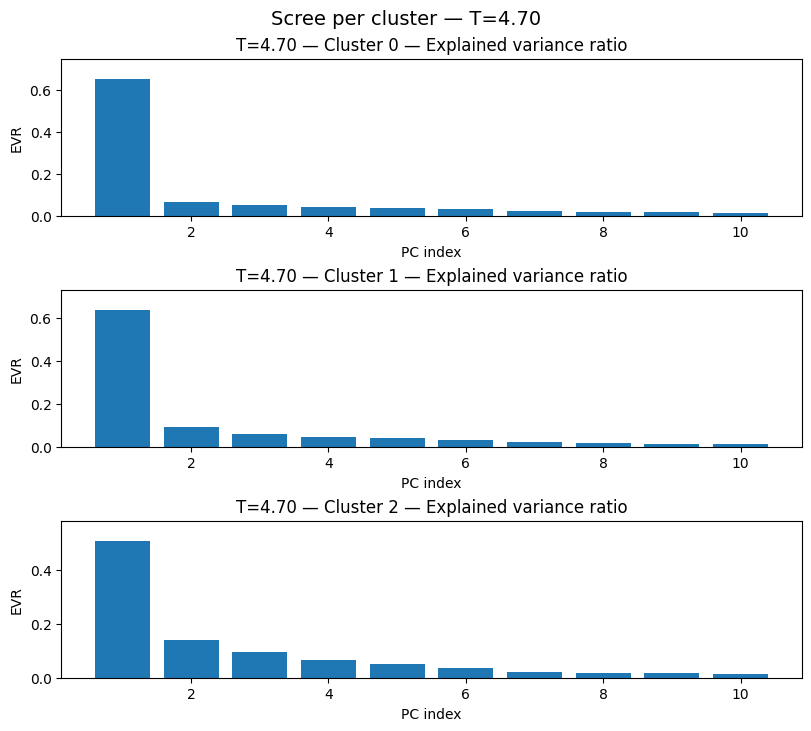

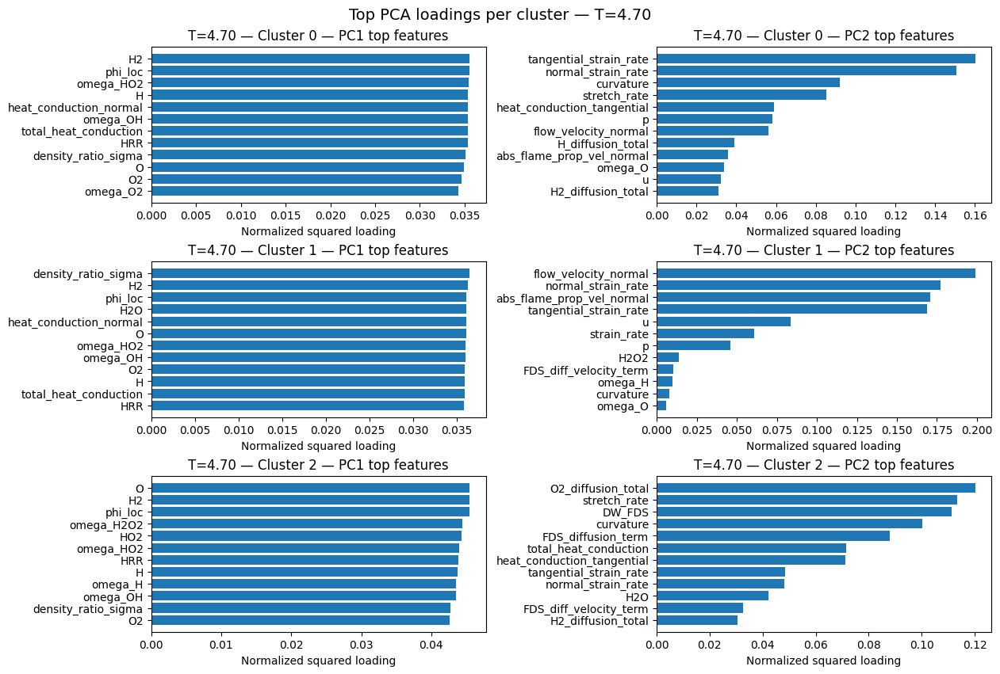

In [4]:

# -------------------------
# PCA HELPERS (unchanged)
# -------------------------
def choose_pca_features(df: pd.DataFrame) -> list[str]:
    """
    Decide which variables PCA uses.
    - explicit: uses PCA_FEATURES_EXPLICIT
    - auto: uses all numeric columns except EXCLUDE_FROM_PCA
    """
    mode = PCA_FEATURE_MODE.lower().strip()
    if mode not in {"explicit", "auto"}:
        raise ValueError("PCA_FEATURE_MODE must be 'explicit' or 'auto'.")

    if mode == "explicit":
        if not PCA_FEATURES_EXPLICIT:
            raise ValueError(
                "PCA_FEATURE_MODE='explicit' but PCA_FEATURES_EXPLICIT is empty. "
                "Fill PCA_FEATURES_EXPLICIT with your desired PCA variables."
            )
        missing = [c for c in PCA_FEATURES_EXPLICIT if c not in df.columns]
        if missing:
            raise ValueError(f"PCA_FEATURES_EXPLICIT columns missing in dataframe: {missing}")
        return list(PCA_FEATURES_EXPLICIT)

    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    feats = [c for c in num_cols if c not in EXCLUDE_FROM_PCA]
    if len(feats) < 2:
        raise ValueError(f"Auto PCA features found {len(feats)} (<2). Adjust EXCLUDE_FROM_PCA.")
    return feats


def clean_numeric_matrix(df: pd.DataFrame, cols: list[str]) -> tuple[np.ndarray, list[str]]:
    X = df[cols].replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")
    return X.to_numpy(), cols


# -------------------------
# I/O: build Case + load fronts
# -------------------------
# Minimal Case fields (per your template)
case = Case(
    base_dir=BASE_DIR,
    phi=PHI,
    lat_size=LAT_SIZE,
    time_step=TIME_STEP,
    post=POST,
)

# If your Case dataclass supports these optional fields, you can enable them:
# (If it doesn't, just delete this try/except block.)
try:
    case = Case(
        base_dir=BASE_DIR,
        phi=PHI,
        lat_size=LAT_SIZE,
        time_step=TIME_STEP,
        post=POST,
        multiple_runs=MULTIPLE_RUNS,
        n_run=N_RUN,
        soret_term=SORET_TERM,
        soret_positive=SORET_POSITIVE,
    )
except TypeError:
    pass

fronts = load_fronts(case, ISOLEVELS)

print(f"Loaded {len(fronts)} fronts from: {BASE_DIR}")
print(f"Isolevels: {list(fronts.keys())}")
print(f"KMeans: {N_CLUSTERS} on [{CLUSTER_FEATURE}]")
print(f"PCA mode: {PCA_FEATURE_MODE}")
if PCA_FEATURE_MODE == "explicit":
    print(f"PCA features (explicit): {PCA_FEATURES_EXPLICIT}")
else:
    print(f"PCA excluded (auto): {EXCLUDE_FROM_PCA}")


# -------------------------
# RUN: clustering + PCA per cluster
# -------------------------
clustered_fronts: dict[float, pd.DataFrame] = {}

for c_val, front in fronts.items():
    front = front.copy()

    for col in ["x", "y", CLUSTER_FEATURE]:
        if col not in front.columns:
            raise ValueError(f"ISO {c_val}: missing required column '{col}'.")

    # (A) KMeans on curvature only
    pipe_cluster = make_pipeline(
        StandardScaler(with_mean=True, with_std=True),
        KMeans(
            n_clusters=N_CLUSTERS,
            init="k-means++",
            n_init=20,
            max_iter=300,
            random_state=0,
        ),
    )
    labels = pipe_cluster.fit_predict(front[[CLUSTER_FEATURE]].to_numpy())
    front["cluster"] = labels
    clustered_fronts[float(c_val)] = front

    # Spatial plot
    plt.figure(figsize=(6.5, 6.0))
    plt.scatter(front["x"], front["y"], c=front["cluster"], s=8, marker="s", linewidths=0)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(f"Spatial clusters (KMeans on curvature) — T={float(c_val):.2f}")
    plt.colorbar(label="cluster")
    plt.show()

    # (B) PCA inside each cluster
    pca_feats = choose_pca_features(front)
    present_clusters = sorted(front["cluster"].unique().tolist())

    nrows = len(present_clusters)
    if nrows == 0:
        continue

    fig_scree, axs_scree = plt.subplots(
        nrows=nrows, ncols=1,
        figsize=(8.0, 2.4 * nrows),
        constrained_layout=True,
        squeeze=False,
    )
    fig_load, axs_load = plt.subplots(
        nrows=nrows, ncols=2,
        figsize=(12.5, 2.8 * nrows),
        constrained_layout=True,
        squeeze=False,
    )

    for i, k in enumerate(present_clusters):
        dfk = front[front["cluster"] == k]

        if len(dfk) < MIN_SAMPLES_PER_CLUSTER_PCA:
            axs_scree[i, 0].axis("off")
            axs_load[i, 0].axis("off")
            axs_load[i, 1].axis("off")
            axs_scree[i, 0].text(
                0.01, 0.5,
                f"Cluster {k}: skipped (n={len(dfk)} < {MIN_SAMPLES_PER_CLUSTER_PCA})",
                va="center",
                fontsize=10,
            )
            continue

        Xk, feats_used = clean_numeric_matrix(dfk, pca_feats)

        if Xk.shape[0] < MIN_SAMPLES_PER_CLUSTER_PCA:
            axs_scree[i, 0].axis("off")
            axs_load[i, 0].axis("off")
            axs_load[i, 1].axis("off")
            axs_scree[i, 0].text(
                0.01, 0.5,
                f"Cluster {k}: skipped after NaN/inf drop (n={Xk.shape[0]})",
                va="center",
                fontsize=10,
            )
            continue

        Xs = StandardScaler().fit_transform(Xk) if PCA_STANDARDIZE else Xk

        n_pcs_fit = min(Xs.shape[1], MAX_PCS_TO_PLOT)
        pca = PCA(n_components=n_pcs_fit, random_state=0).fit(Xs)

        evr = pca.explained_variance_ratio_
        idx = np.arange(1, len(evr) + 1)

        # Scree
        ax = axs_scree[i, 0]
        ax.bar(idx, evr)
        ax.set_title(f"T={float(c_val):.2f} — Cluster {k} — Explained variance ratio")
        ax.set_xlabel("PC index")
        ax.set_ylabel("EVR")
        ax.set_ylim(0, max(0.05, float(np.max(evr)) * 1.15))

        # Top loadings for PC1/PC2
        comps = pca.components_
        feats_arr = np.array(feats_used)

        def plot_pc_contrib(ax_, pc_idx: int, title: str):
            if pc_idx >= comps.shape[0]:
                ax_.axis("off")
                ax_.text(0.01, 0.5, f"{title}: not available", va="center", fontsize=10)
                return

            load = comps[pc_idx, :]
            contrib = load ** 2
            s = contrib.sum()
            if s > 0:
                contrib = contrib / s

            order = np.argsort(contrib)[::-1][:TOP_LOADINGS]
            top_feats = feats_arr[order][::-1]
            top_vals = contrib[order][::-1]

            ax_.barh(top_feats, top_vals)
            ax_.set_title(title)
            ax_.set_xlabel("Normalized squared loading")

        plot_pc_contrib(
            axs_load[i, 0],
            pc_idx=0,
            title=f"T={float(c_val):.2f} — Cluster {k} — PC1 top features",
        )
        plot_pc_contrib(
            axs_load[i, 1],
            pc_idx=1,
            title=f"T={float(c_val):.2f} — Cluster {k} — PC2 top features",
        )

    fig_scree.suptitle(f"Scree per cluster — T={float(c_val):.2f}", fontsize=14)
    fig_load.suptitle(f"Top PCA loadings per cluster — T={float(c_val):.2f}", fontsize=14)
    plt.show()

# `clustered_fronts` is ready for Block 2 (prediction + permutation importance).



=== ISOLEVEL 3.00 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=3144, features=43


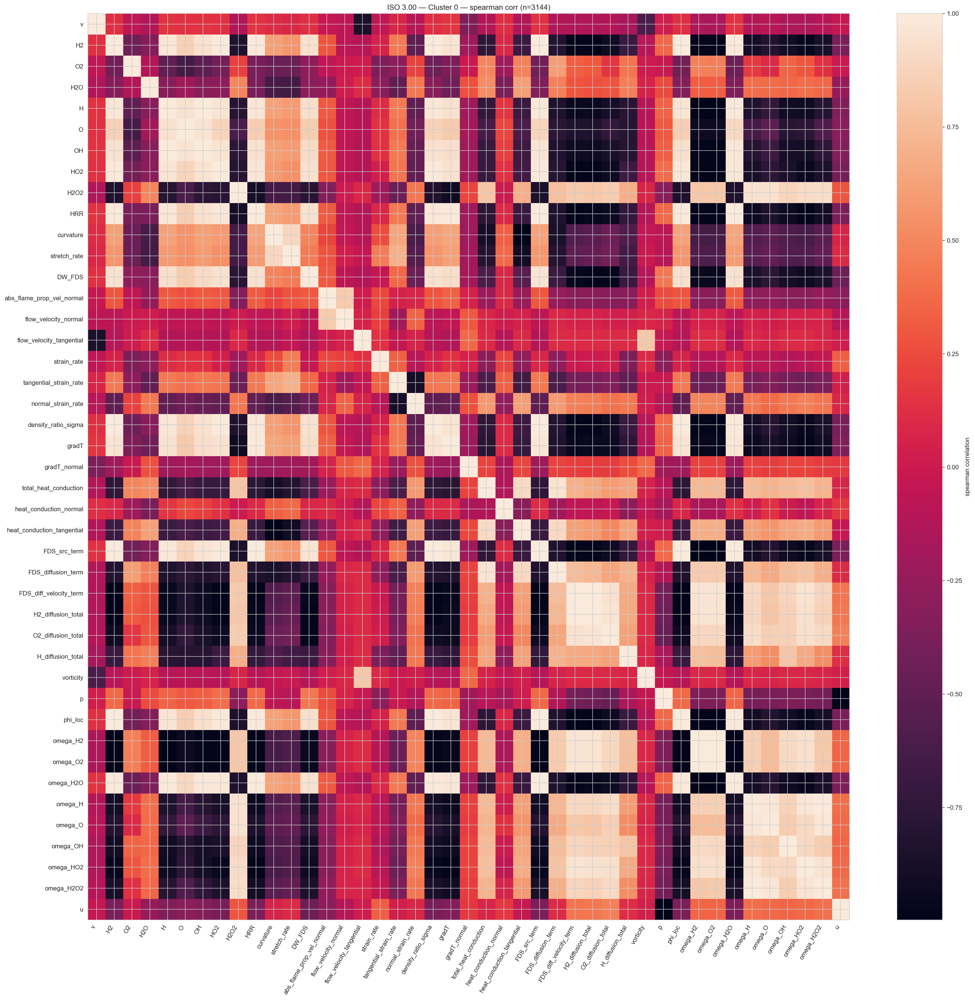

Cluster 1: skip corr (n=55 < 200)
Cluster 2: skip corr (n=132 < 200)

=== ISOLEVEL 3.50 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=3190, features=43


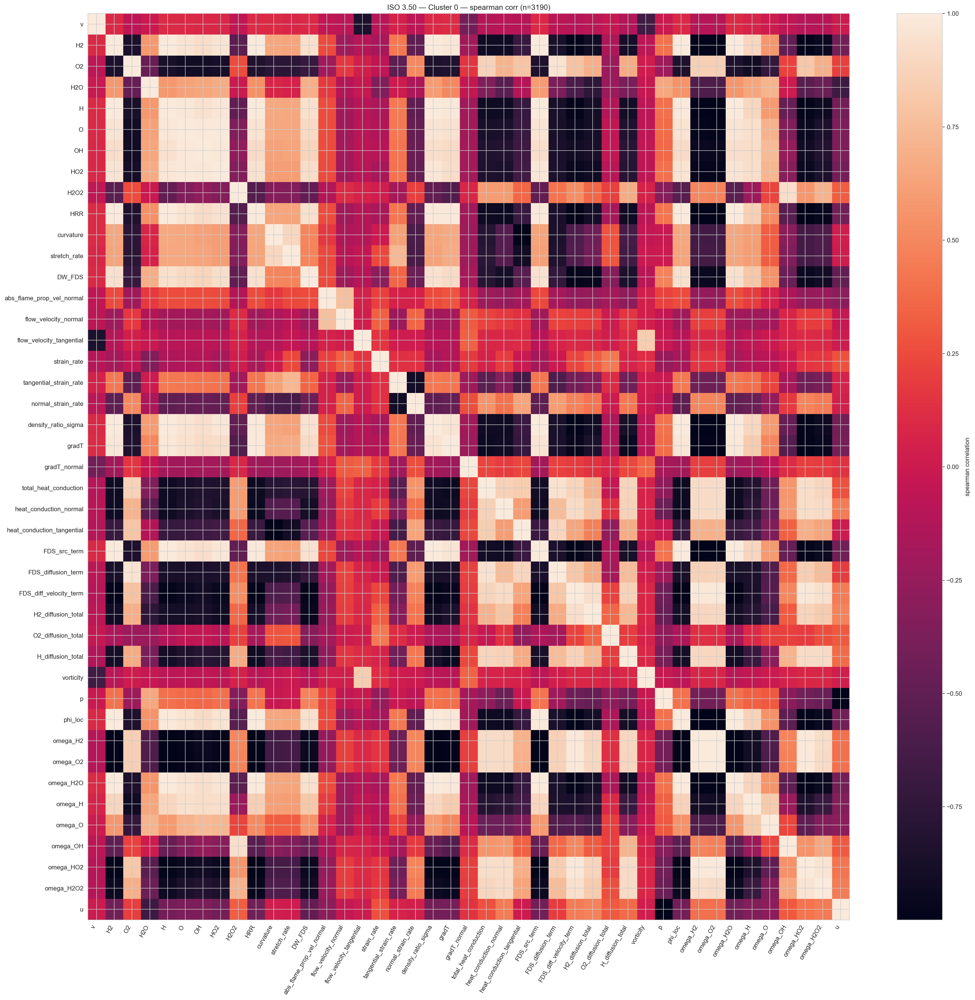

Cluster 1: corr computed on n=308, features=43


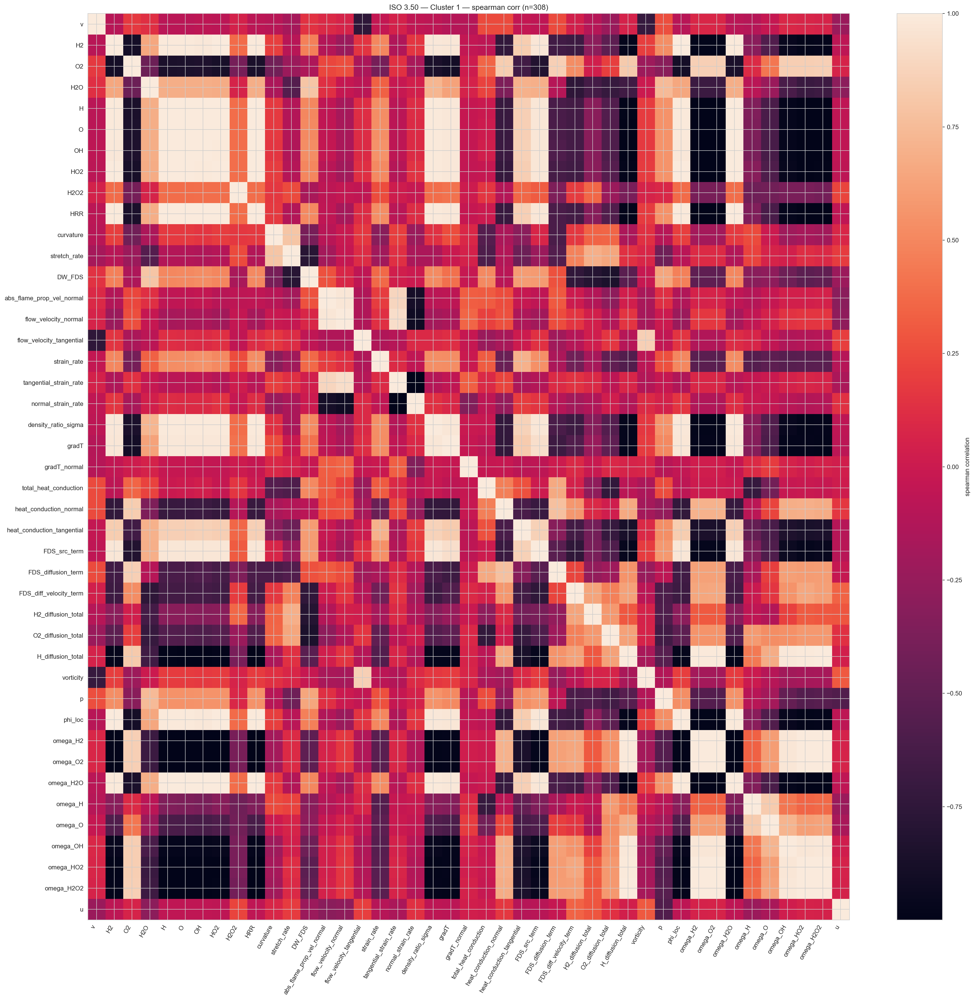

Cluster 2: skip corr (n=55 < 200)

=== ISOLEVEL 4.40 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=6075, features=43


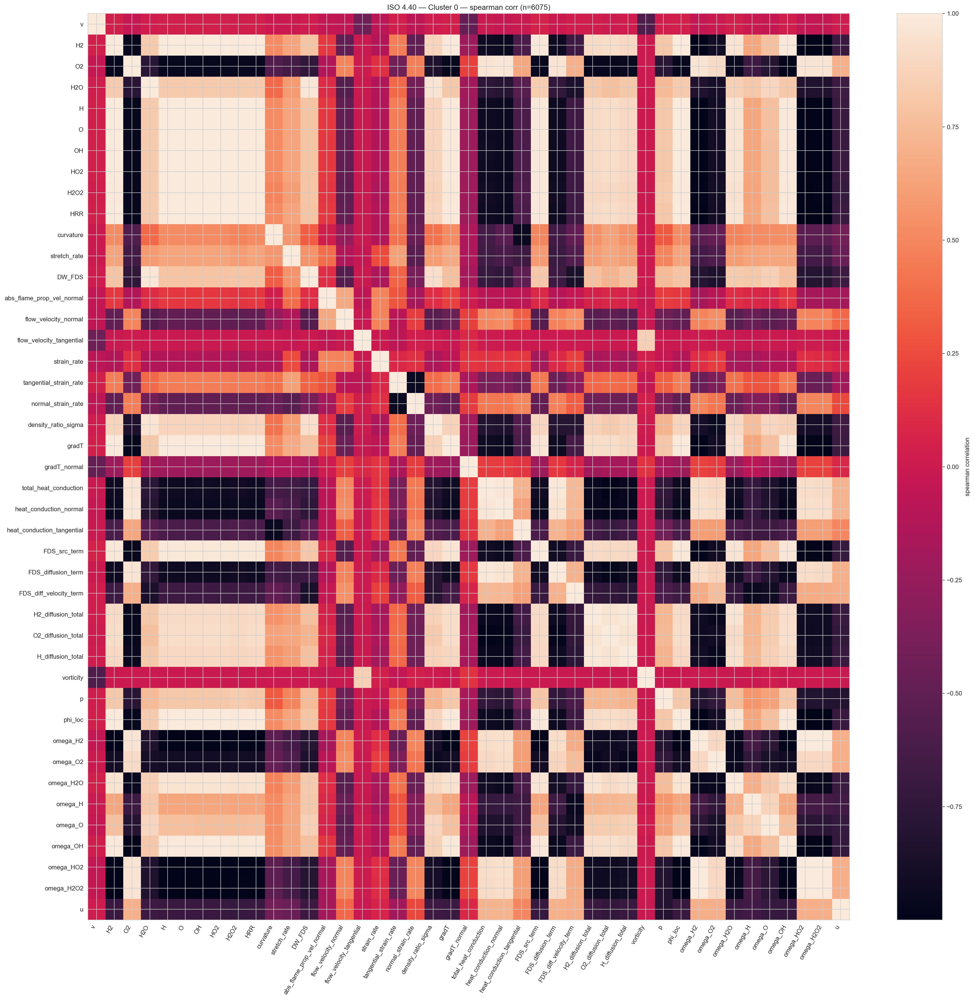

Cluster 1: skip corr (n=14 < 200)
Cluster 2: corr computed on n=252, features=43


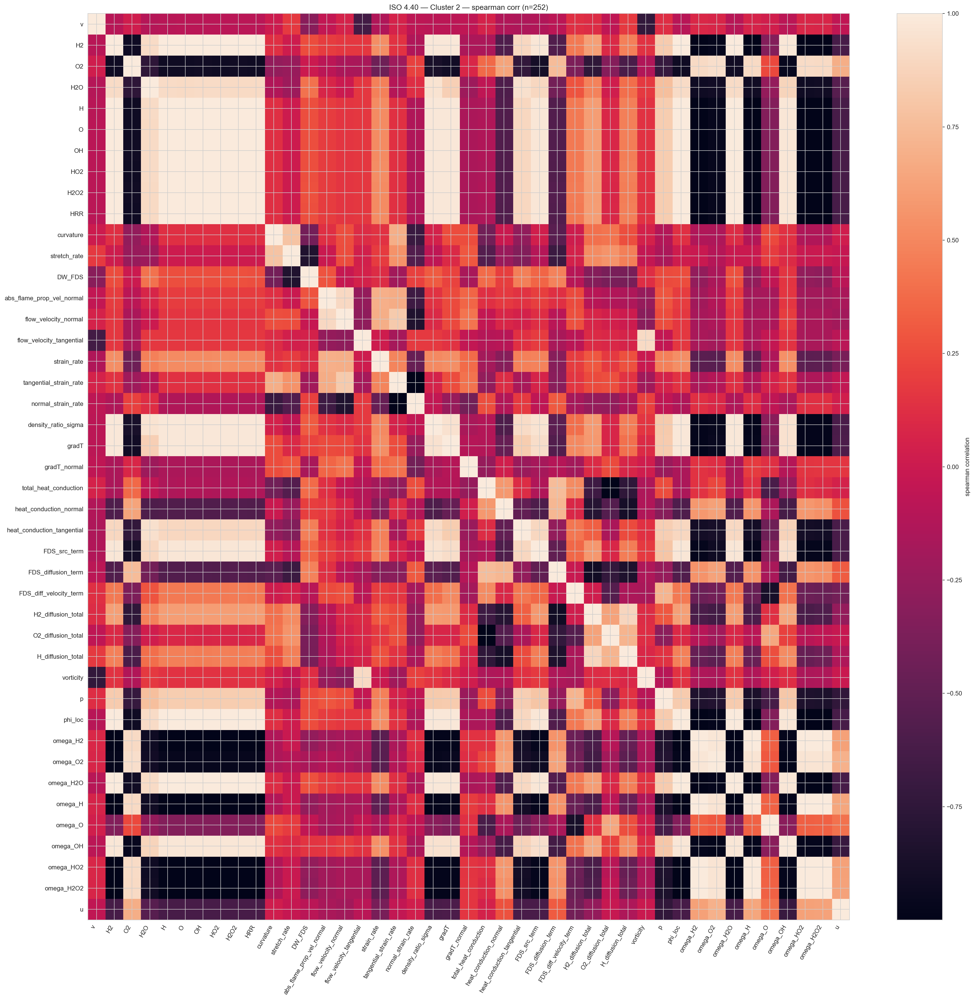


=== ISOLEVEL 4.50 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=560, features=43


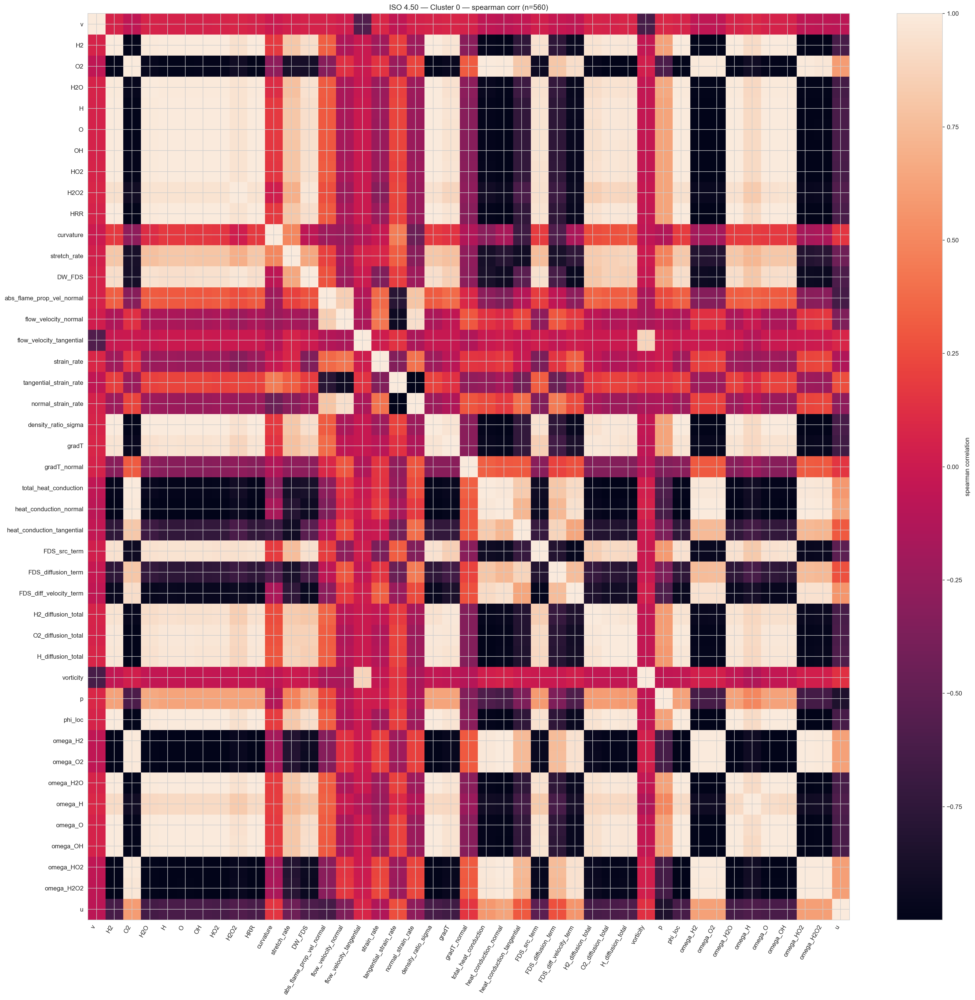

Cluster 1: corr computed on n=218, features=43


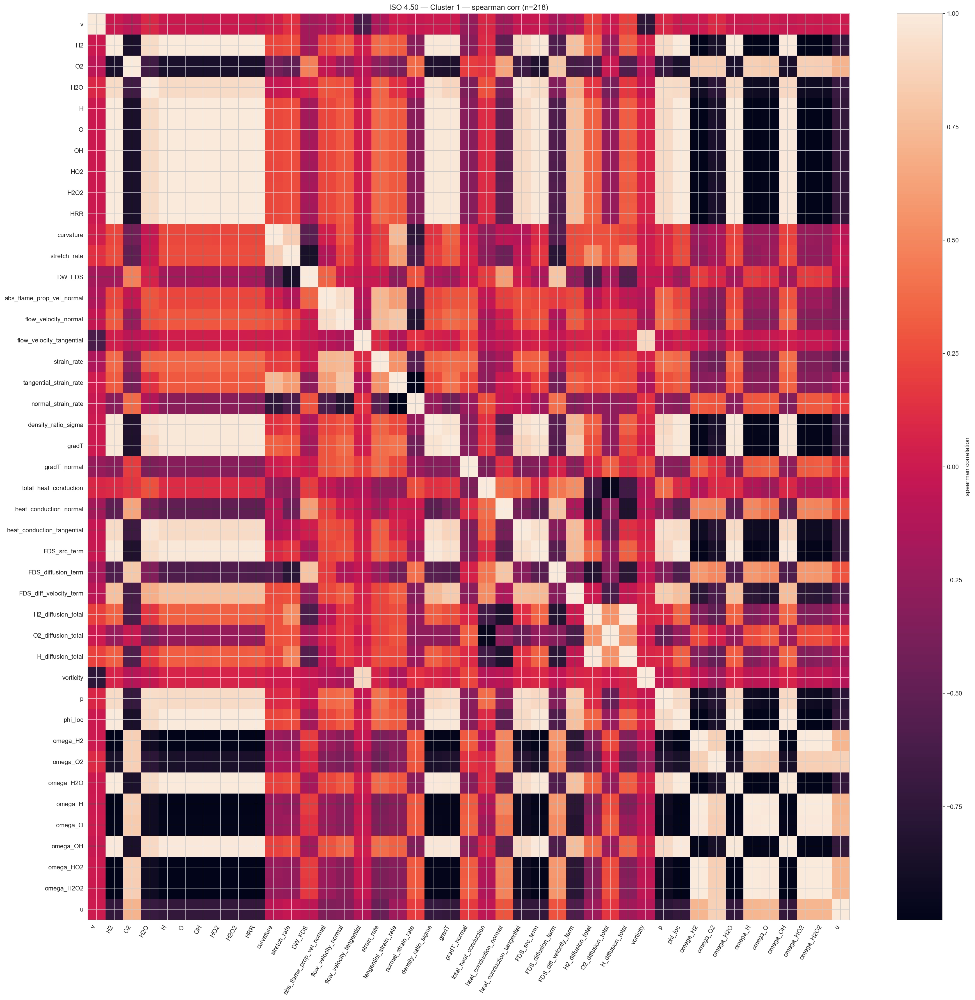

Cluster 2: corr computed on n=8046, features=43


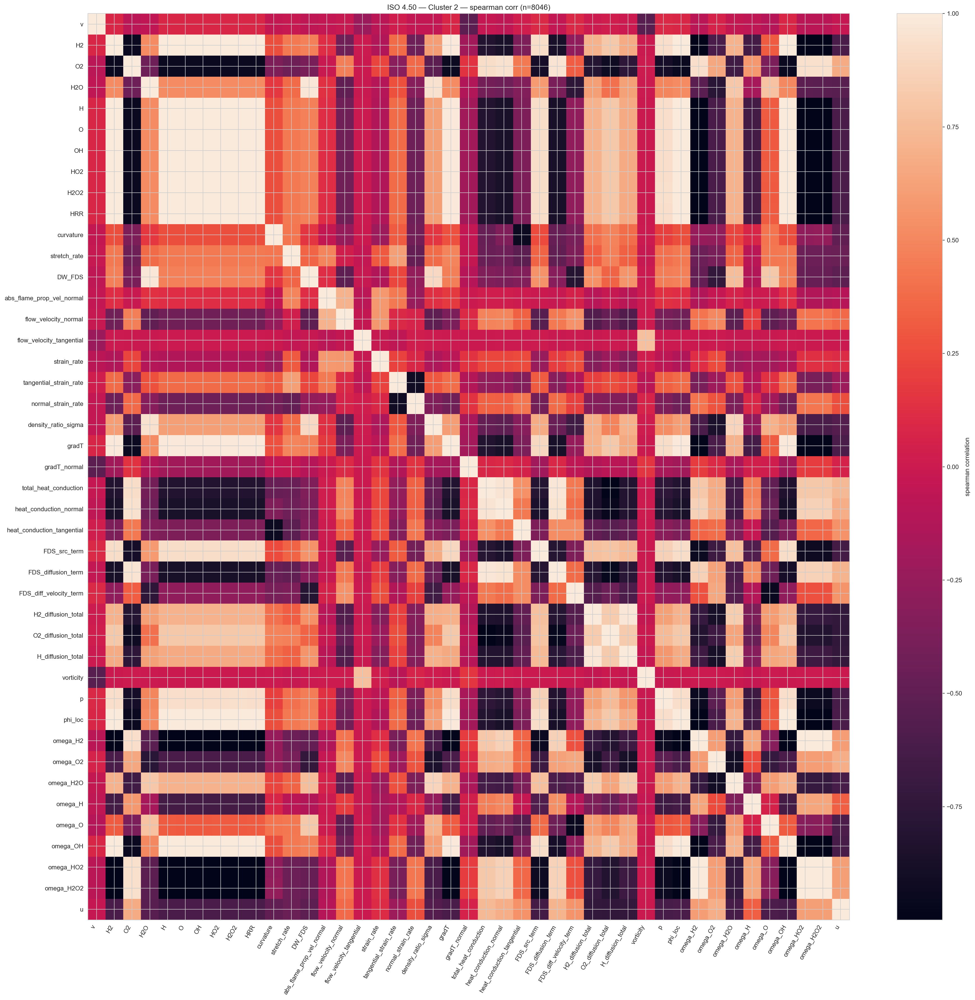


=== ISOLEVEL 4.60 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=10997, features=43


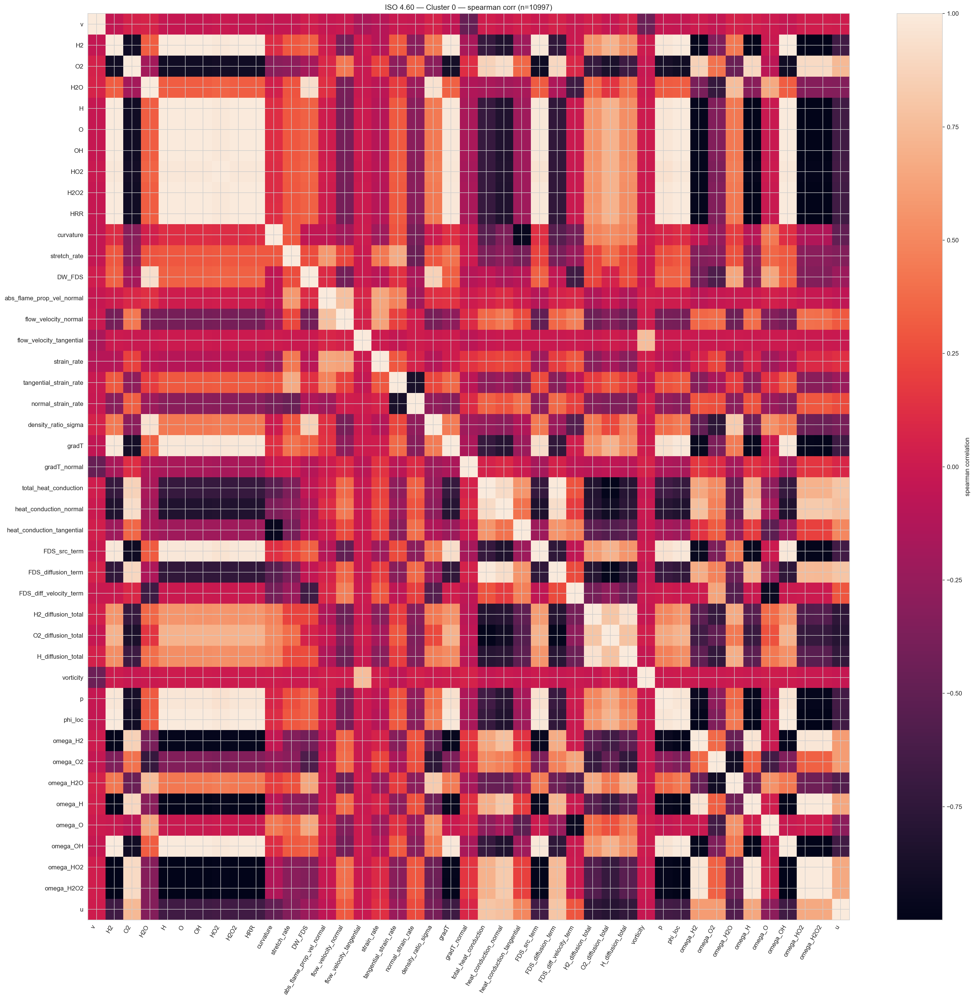

Cluster 1: skip corr (n=4 < 200)
Cluster 2: corr computed on n=587, features=43


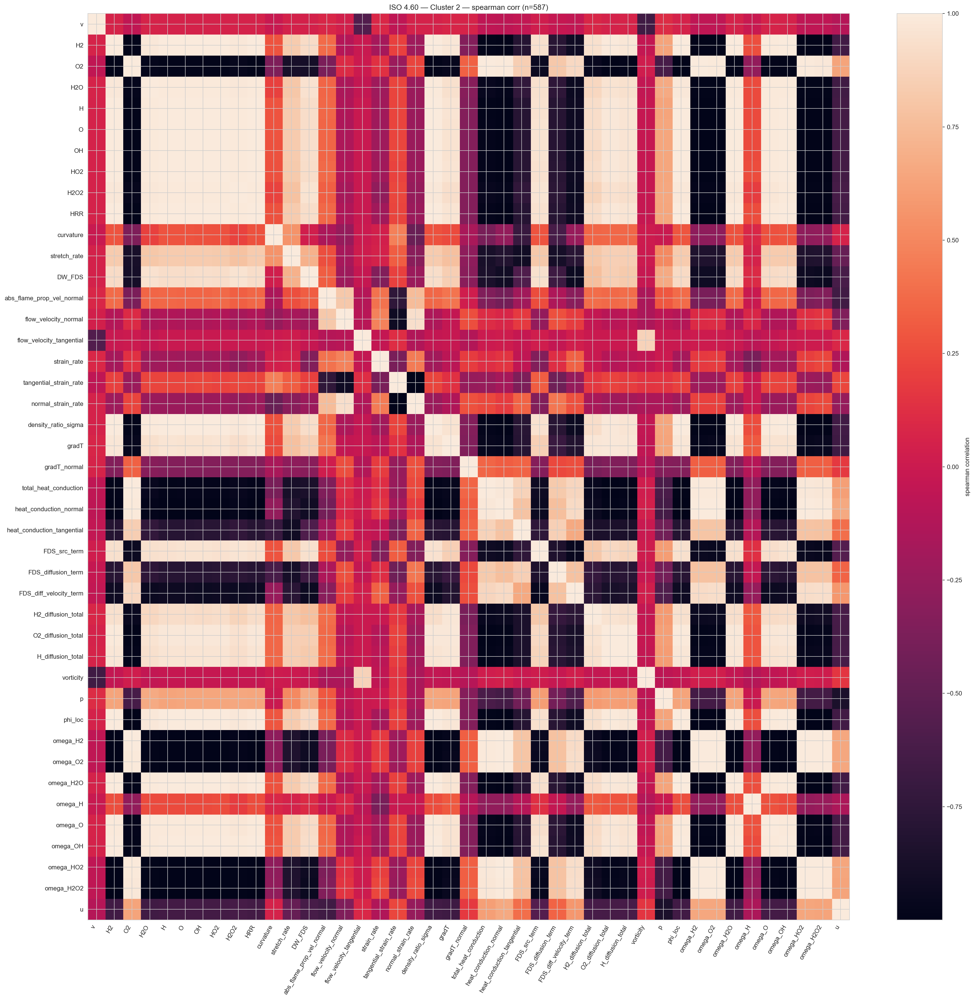


=== ISOLEVEL 4.70 | clusters=[0, 1, 2] ===
Cluster 0: corr computed on n=11131, features=43


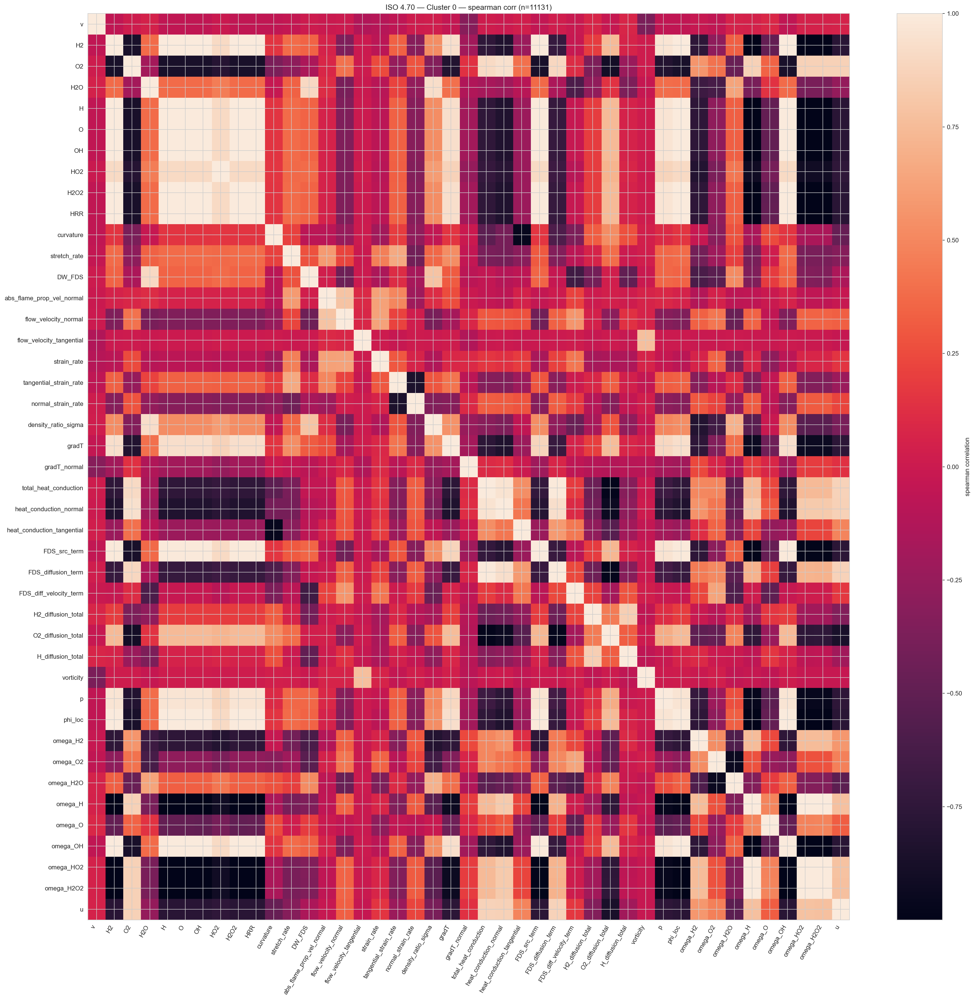

Cluster 1: corr computed on n=428, features=43


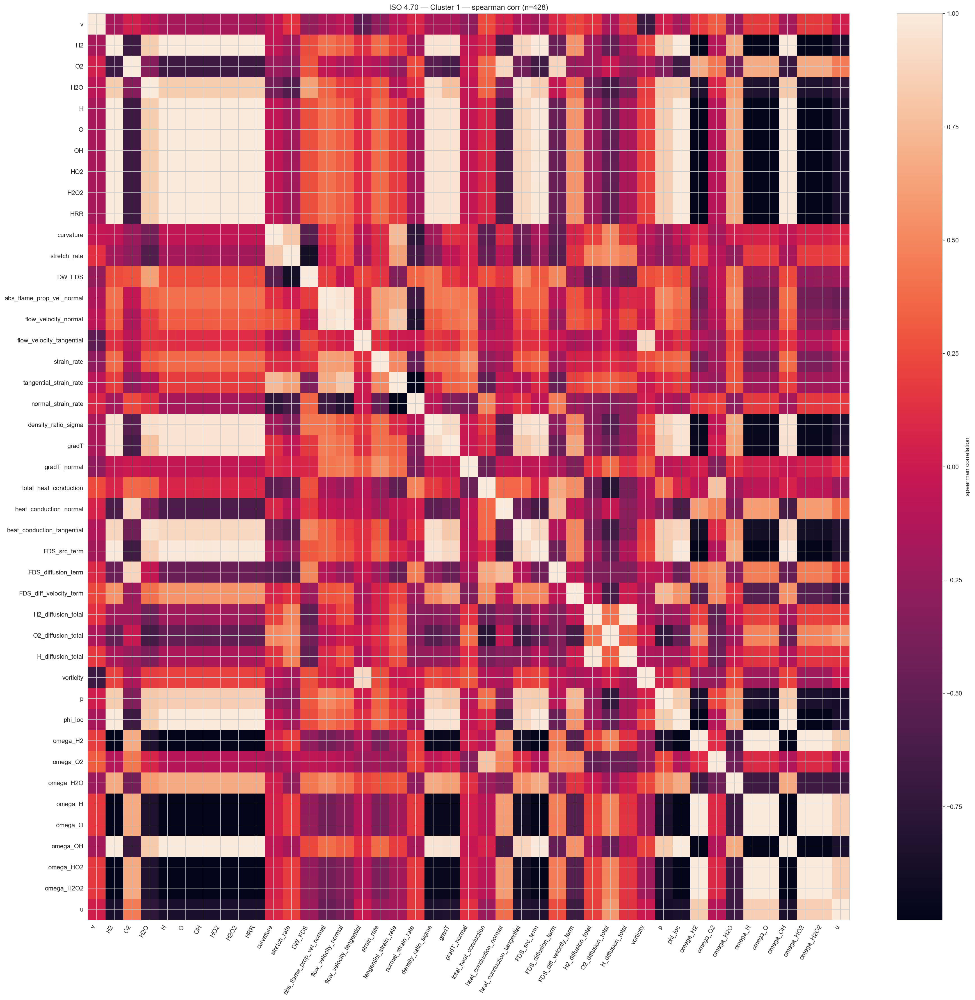

Cluster 2: corr computed on n=549, features=43


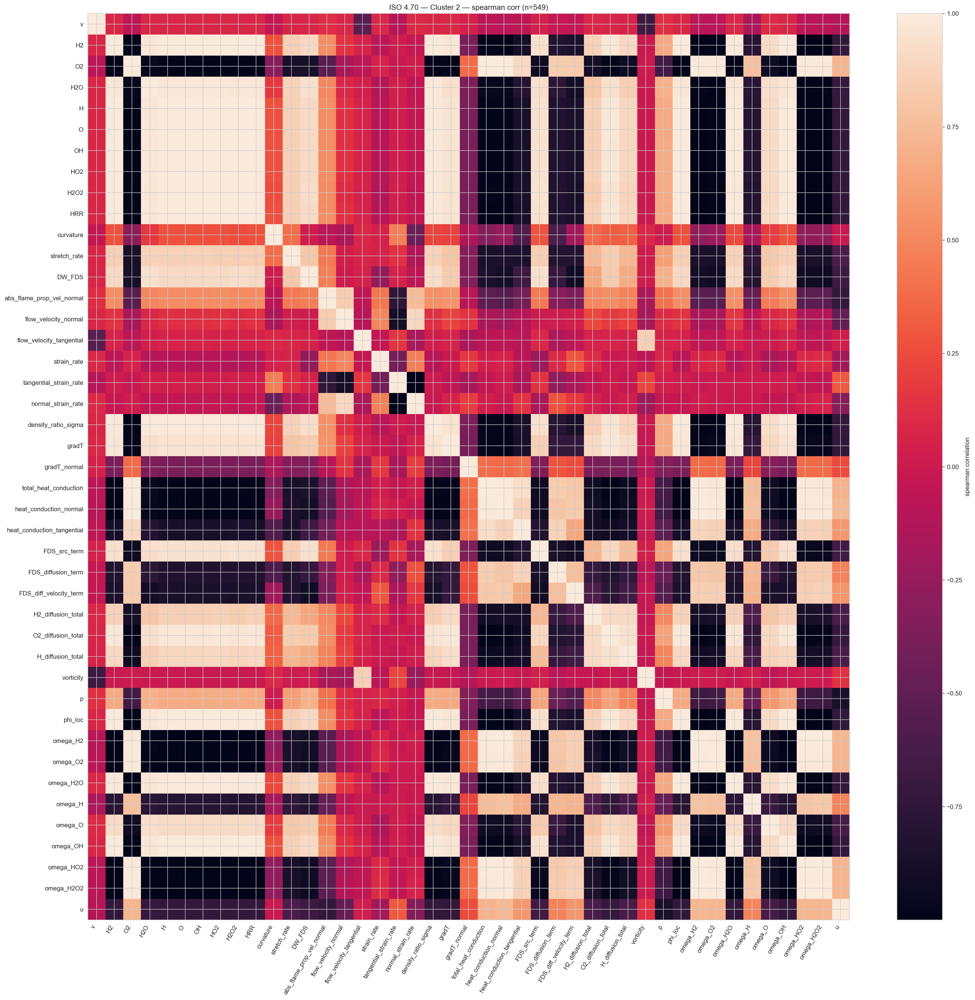

In [133]:
# ============================================================
# CORRELATIONS INSIDE EACH CLUSTER (per isolevel)
# - Computes correlation matrix on your PCA features inside each cluster
# - Plots a heatmap per cluster (optionally only top-N features by |corr| with a target)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# USER SETTINGS
# -------------------------
CORR_METHOD = "spearman"   # "pearson" or "spearman" (spearman is safer for nonlinear/monotone)
MIN_SAMPLES_PER_CLUSTER_CORR = 200

# To keep plots readable:
PLOT_MODE = "all"  # "all" or "target_topN"
TARGET_FOR_TOPN = "DW_FDS" # only used if PLOT_MODE="target_topN" and column exists
TOPN_FEATURES_CORR = 18    # number of features to show in the heatmap (if target_topN)

# Set True if you want absolute correlations when selecting top features (recommended)
USE_ABS_FOR_TOPN = True


def _clean_df_for_corr(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    d = df[cols].replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")
    # drop constant columns (std=0) to avoid NaNs in corr
    nunique = d.nunique()
    keep = nunique[nunique > 1].index.tolist()
    return d[keep]


def _plot_corr_heatmap(corr: pd.DataFrame, title: str):
    if corr.empty:
        return
    fig = plt.figure(figsize=(0.45 * len(corr.columns) + 4, 0.45 * len(corr.index) + 3), dpi=160)
    ax = fig.add_subplot(111)

    im = ax.imshow(corr.to_numpy(), aspect="auto")
    ax.set_xticks(np.arange(len(corr.columns)))
    ax.set_xticklabels(corr.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(len(corr.index)))
    ax.set_yticklabels(corr.index)

    plt.colorbar(im, ax=ax, label=f"{CORR_METHOD} correlation")
    ax.set_title(title)
    fig.tight_layout()
    plt.show()


# -------------------------
# RUN: per isolevel, per cluster
# -------------------------
for c_val, front in clustered_fronts.items():
    front = front.copy()

    # Use the same PCA feature selection logic you defined
    pca_feats = choose_pca_features(front)

    # Optionally include TARGET_FOR_TOPN in the correlation computation (for top-N selection)
    corr_cols = list(pca_feats)
    if (PLOT_MODE == "target_topN") and (TARGET_FOR_TOPN in front.columns) and (TARGET_FOR_TOPN not in corr_cols):
        corr_cols = corr_cols + [TARGET_FOR_TOPN]

    present_clusters = sorted(front["cluster"].unique().tolist())

    print(f"\n=== ISOLEVEL {float(c_val):.2f} | clusters={present_clusters} ===")

    for k in present_clusters:
        dfk = front[front["cluster"] == k]
        n0 = len(dfk)

        if n0 < MIN_SAMPLES_PER_CLUSTER_CORR:
            print(f"Cluster {k}: skip corr (n={n0} < {MIN_SAMPLES_PER_CLUSTER_CORR})")
            continue

        d = _clean_df_for_corr(dfk, corr_cols)
        n = len(d)

        if n < MIN_SAMPLES_PER_CLUSTER_CORR:
            print(f"Cluster {k}: skip corr after clean (n={n})")
            continue

        corr_full = d.corr(method=CORR_METHOD)

        # ---- decide what to plot ----
        if PLOT_MODE == "all":
            corr_plot = corr_full

        elif PLOT_MODE == "target_topN":
            if TARGET_FOR_TOPN not in corr_full.columns:
                # fallback to all if target missing
                corr_plot = corr_full
            else:
                # select top-N features most correlated with target
                corrs = corr_full[TARGET_FOR_TOPN].drop(labels=[TARGET_FOR_TOPN], errors="ignore")

                if USE_ABS_FOR_TOPN:
                    top_feats = corrs.abs().sort_values(ascending=False).head(TOPN_FEATURES_CORR).index.tolist()
                else:
                    top_feats = corrs.sort_values(ascending=False).head(TOPN_FEATURES_CORR).index.tolist()

                # include target as last row/col for context
                feats = top_feats + [TARGET_FOR_TOPN]
                corr_plot = corr_full.loc[feats, feats]

        else:
            raise ValueError("PLOT_MODE must be 'all' or 'target_topN'")

        print(f"Cluster {k}: corr computed on n={n}, features={len(corr_plot.columns)}")

        _plot_corr_heatmap(
            corr_plot,
            title=f"ISO {float(c_val):.2f} — Cluster {k} — {CORR_METHOD} corr (n={n})",
        )



ISOLEVEL T=3.00
Cluster  0 | n=  3144 | DW_FDS = +1.192e+00 +3.345e-01*curvature -4.786e-02*stretch_rate | R^2=0.028 RMSE=2.031e-01
Cluster 1: skip fit (n=55 < 200)
Cluster 2: skip fit (n=132 < 200)


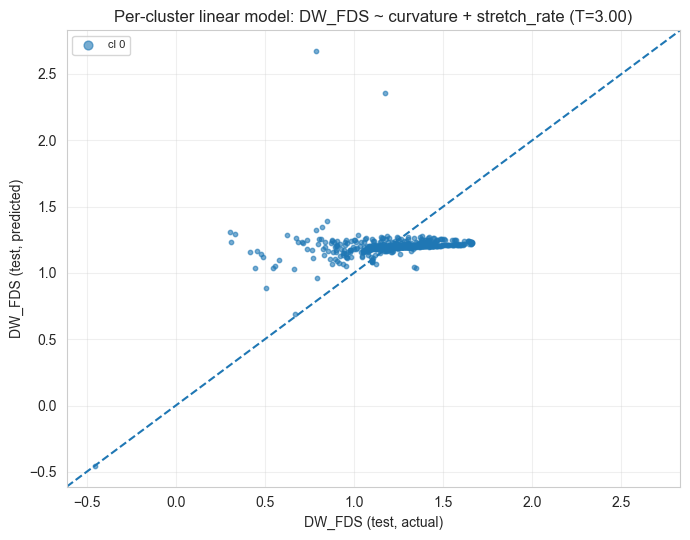

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,3.0,0,3144,1.191881,0.334461,-0.047861,0.027903,0.203063



ISOLEVEL T=3.50
Cluster  0 | n=  3190 | DW_FDS = +1.098e+00 -2.072e-01*curvature +1.493e-01*stretch_rate | R^2=0.087 RMSE=2.681e-01
Cluster  1 | n=   308 | DW_FDS = +6.845e-01 +2.337e-01*curvature -1.490e-01*stretch_rate | R^2=0.700 RMSE=2.269e-01
Cluster 2: skip fit (n=55 < 200)


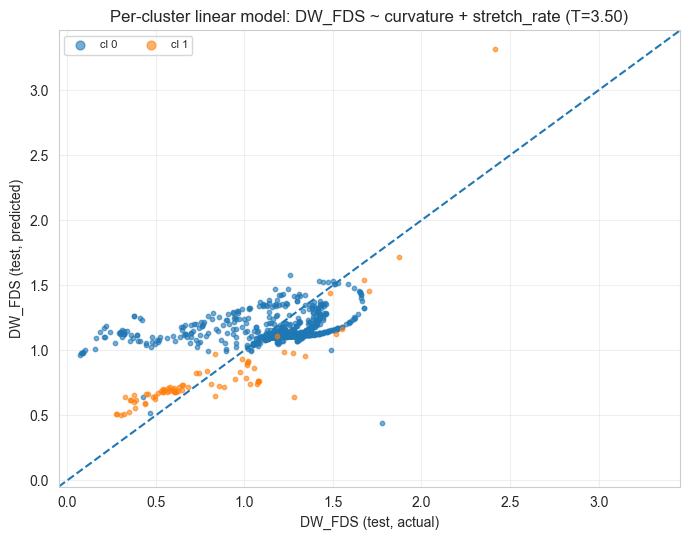

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,3.5,0,3190,1.097722,-0.207194,0.149299,0.087154,0.268072
1,3.5,1,308,0.684532,0.233678,-0.149007,0.699600,0.226929



ISOLEVEL T=4.40
Cluster  0 | n=  6075 | DW_FDS = +5.134e-01 -1.836e-01*curvature +3.168e-01*stretch_rate | R^2=0.176 RMSE=5.487e-01
Cluster 1: skip fit (n=14 < 200)
Cluster  2 | n=   252 | DW_FDS = +7.681e-01 +3.574e-01*curvature -9.424e-02*stretch_rate | R^2=0.654 RMSE=3.557e-01


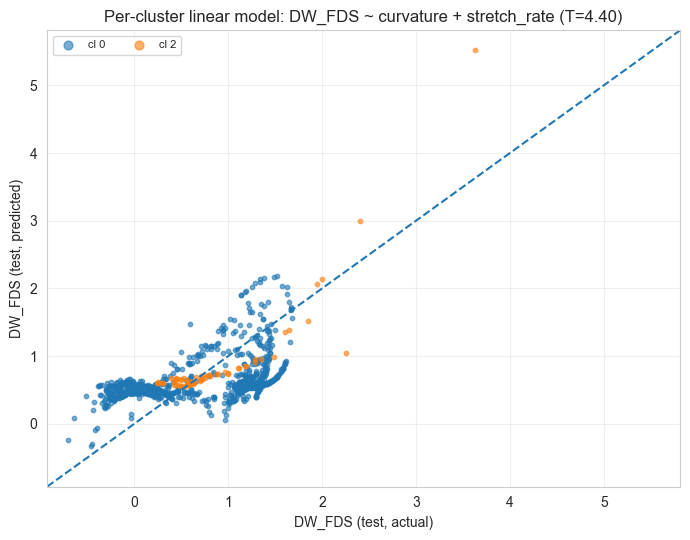

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.4,0,6075,0.513417,-0.183630,0.316825,0.175833,0.548678
1,4.4,2,252,0.768065,0.357381,-0.094244,0.654379,0.355710



ISOLEVEL T=4.50
Cluster  0 | n=   560 | DW_FDS = +5.151e-01 -1.207e-01*curvature +2.094e-01*stretch_rate | R^2=0.700 RMSE=3.911e-01
Cluster  1 | n=   218 | DW_FDS = +7.193e-01 +3.654e-01*curvature -1.076e-01*stretch_rate | R^2=0.778 RMSE=1.746e-01
Cluster  2 | n=  8046 | DW_FDS = +3.718e-01 -9.490e-02*curvature +5.293e-01*stretch_rate | R^2=0.107 RMSE=5.136e-01


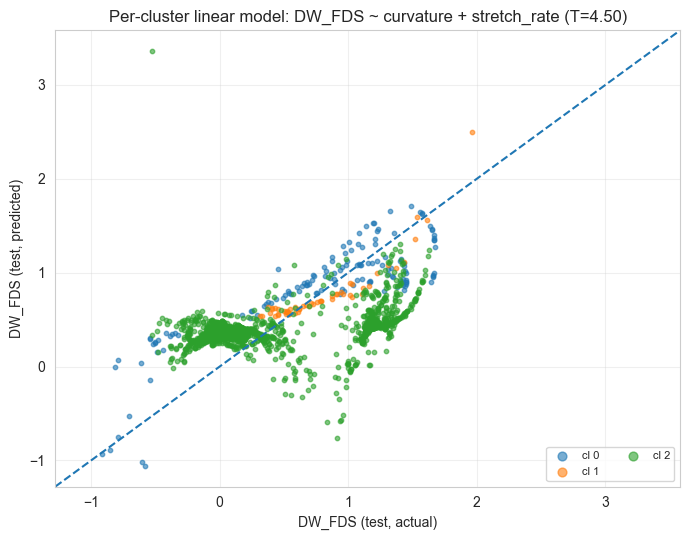

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.5,0,560,0.515065,-0.120738,0.209398,0.699576,0.391052
1,4.5,1,218,0.719269,0.365434,-0.107613,0.777662,0.174642
2,4.5,2,8046,0.371779,-0.094897,0.529258,0.107022,0.513605



ISOLEVEL T=4.60
Cluster  0 | n= 10997 | DW_FDS = +2.588e-01 +9.791e-02*curvature -1.524e-02*stretch_rate | R^2=0.002 RMSE=5.235e-01
Cluster 1: skip fit (n=4 < 200)
Cluster  2 | n=   587 | DW_FDS = +5.647e-01 +7.505e-02*curvature +9.558e-02*stretch_rate | R^2=0.494 RMSE=6.229e-01


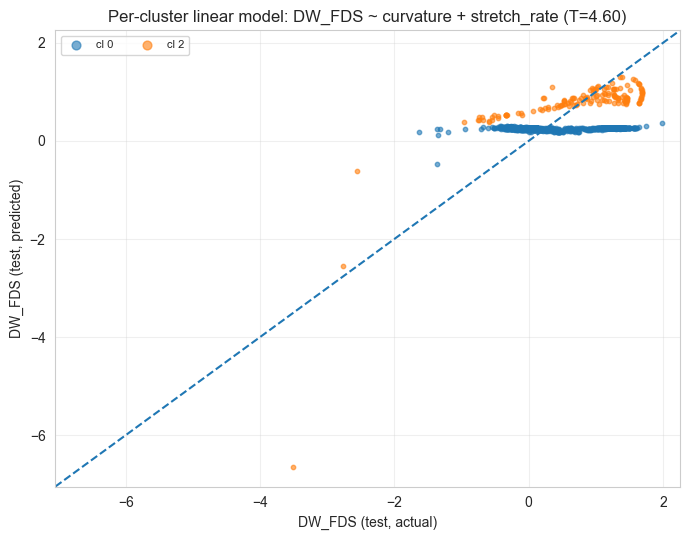

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.6,0,10997,0.258765,0.097909,-0.015236,0.002085,0.523469
1,4.6,2,587,0.564737,0.075047,0.095585,0.493892,0.622879



ISOLEVEL T=4.70
Cluster  0 | n= 11131 | DW_FDS = +1.577e-01 +1.806e-01*curvature +7.197e-01*stretch_rate | R^2=0.192 RMSE=4.811e-01
Cluster  1 | n=   428 | DW_FDS = +4.595e-01 +2.451e-01*curvature -1.008e-01*stretch_rate | R^2=0.716 RMSE=1.878e-01
Cluster  2 | n=   549 | DW_FDS = +2.745e-01 +1.774e-01*curvature +1.531e-01*stretch_rate | R^2=0.631 RMSE=5.470e-01


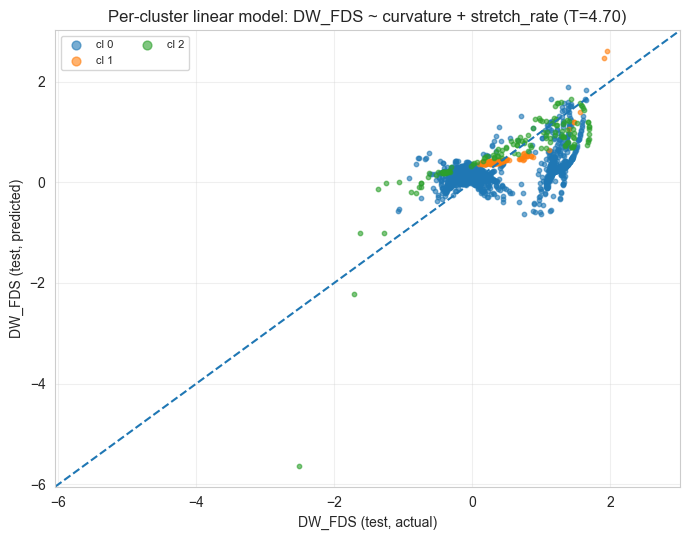

,isolevel,cluster,n,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.7,0,11131,0.157666,0.180580,0.719685,0.191796,0.481117
1,4.7,1,428,0.459504,0.245148,-0.100769,0.715780,0.187767
2,4.7,2,549,0.274539,0.177374,0.153065,0.631241,0.547001


In [134]:
# ============================================================
# BLOCK 2: Per-cluster linear regression for DW_FDS
#   Model: DW_FDS = a0 + a1*curvature + a2*stretch_rate
# - Fits one model per cluster (within each isolevel)
# - Reports coefficients + R^2 + RMSE
# - Plots DW_FDS vs predicted, colored by cluster
# ============================================================

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

# -------------------------
# USER SETTINGS (BLOCK 2)
# -------------------------
TARGET = "DW_FDS"
X_FEATURES = ["curvature", "stretch_rate"]   # linear dependence
TEST_SIZE = 0.25
RANDOM_STATE = 0
MIN_SAMPLES_PER_CLUSTER_FIT = 200

for c_val, front in clustered_fronts.items():
    print(f"\n==============================")
    print(f"ISOLEVEL T={float(c_val):.2f}")
    print(f"==============================")

    # sanity checks
    missing = [c for c in (["cluster"] + X_FEATURES + [TARGET]) if c not in front.columns]
    if missing:
        raise ValueError(f"ISO {c_val}: missing columns needed for regression: {missing}")

    # collect per-cluster results
    rows = []

    # optional plot: all clusters on one scatter (actual vs predicted)
    plt.figure(figsize=(7.0, 5.5))

    for k in sorted(front["cluster"].unique()):
        dfk = front[front["cluster"] == k].copy()

        # clean rows
        dfk = dfk.replace([np.inf, -np.inf], np.nan).dropna(subset=X_FEATURES + [TARGET])
        n = len(dfk)

        if n < MIN_SAMPLES_PER_CLUSTER_FIT:
            print(f"Cluster {k}: skip fit (n={n} < {MIN_SAMPLES_PER_CLUSTER_FIT})")
            continue

        X = dfk[X_FEATURES].to_numpy(dtype=float)
        y = dfk[TARGET].to_numpy(dtype=float)

        Xtr, Xte, ytr, yte = train_test_split(
            X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE
        )

        model = LinearRegression(fit_intercept=True)
        model.fit(Xtr, ytr)

        ypred = model.predict(Xte)

        r2 = float(r2_score(yte, ypred))
        rmse = float(np.sqrt(mean_squared_error(yte, ypred)))

        a0 = float(model.intercept_)
        a1 = float(model.coef_[0])  # curvature
        a2 = float(model.coef_[1])  # stretch_rate

        rows.append({
            "isolevel": float(c_val),
            "cluster": int(k),
            "n": int(n),
            "intercept": a0,
            "coef_curvature": a1,
            "coef_stretch_rate": a2,
            "r2_test": r2,
            "rmse_test": rmse,
        })

        print(
            f"Cluster {k:>2d} | n={n:>6d} | "
            f"DW_FDS = {a0:+.3e} {a1:+.3e}*curvature {a2:+.3e}*stretch_rate | "
            f"R^2={r2:.3f} RMSE={rmse:.3e}"
        )

        # add to scatter (actual vs predicted)
        plt.scatter(yte, ypred, s=10, alpha=0.6, label=f"cl {k}")

    # finalize plot
    plt.xlabel("DW_FDS (test, actual)")
    plt.ylabel("DW_FDS (test, predicted)")
    plt.title(f"Per-cluster linear model: DW_FDS ~ curvature + stretch_rate (T={float(c_val):.2f})")
    plt.grid(True, alpha=0.3)
    plt.legend(markerscale=2, fontsize=8, ncol=2)

    # 1:1 line
    ax = plt.gca()
    lims = [
        min(ax.get_xlim()[0], ax.get_ylim()[0]),
        max(ax.get_xlim()[1], ax.get_ylim()[1]),
    ]
    plt.plot(lims, lims, linestyle="--")
    plt.xlim(lims)
    plt.ylim(lims)

    plt.tight_layout()
    plt.show()

    # results table
    if rows:
        results_df = pd.DataFrame(rows).sort_values(["cluster"])
        display(results_df)
    else:
        print("No clusters had enough samples to fit.")



ISOLEVEL T=3.00  |  manual bins by curvature
Small-curvature threshold eps = 0.024857
curv_bin
pos      2066
small     667
neg       598


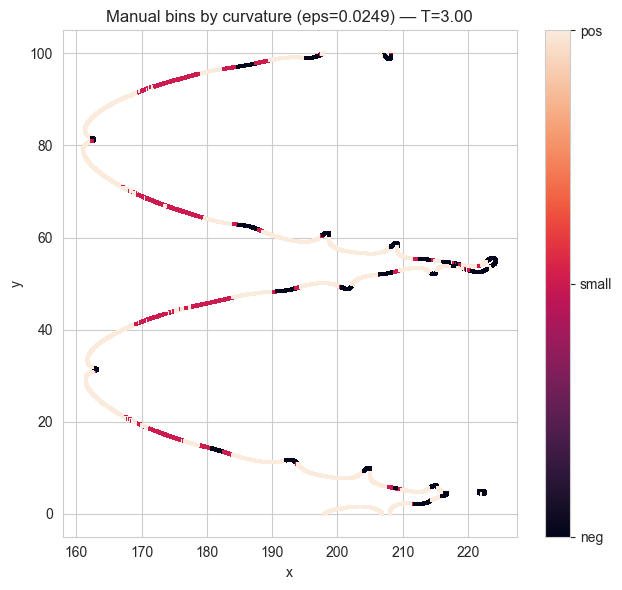

Bin '  neg' | n=   598 | DW_FDS = +9.529e-01 -1.661e-01*curvature -2.199e-02*stretch_rate | R^2=0.630 RMSE=2.226e-01
Bin 'small' | n=   667 | DW_FDS = +1.148e+00 +1.813e+00*curvature +2.418e-02*stretch_rate | R^2=-0.117 RMSE=6.193e-02
Bin '  pos' | n=  2066 | DW_FDS = +1.276e+00 +5.714e-02*curvature -3.841e-02*stretch_rate | R^2=0.157 RMSE=2.409e-01


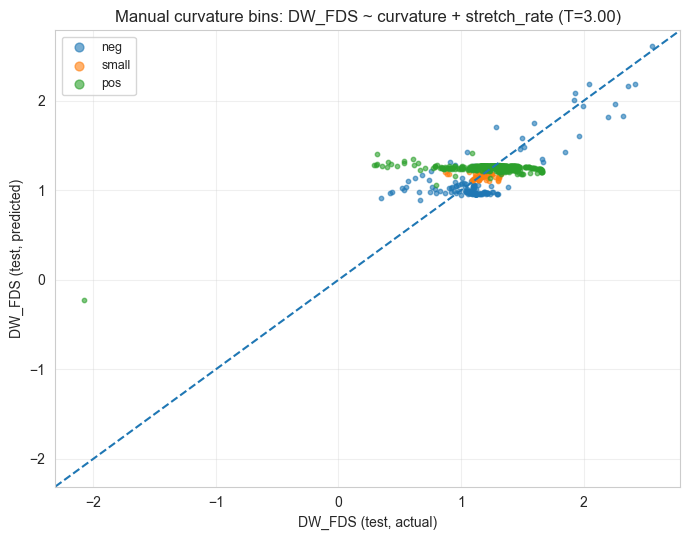

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,3.0,neg,598,0.024857,0.952868,-0.166129,-0.021993,0.629654,0.222567
2,3.0,pos,2066,0.024857,1.276378,0.057143,-0.038406,0.156696,0.240890
1,3.0,small,667,0.024857,1.148097,1.813025,0.024177,-0.117453,0.061930



ISOLEVEL T=3.50  |  manual bins by curvature
Small-curvature threshold eps = 0.0265633
curv_bin
pos      2045
neg       797
small     711


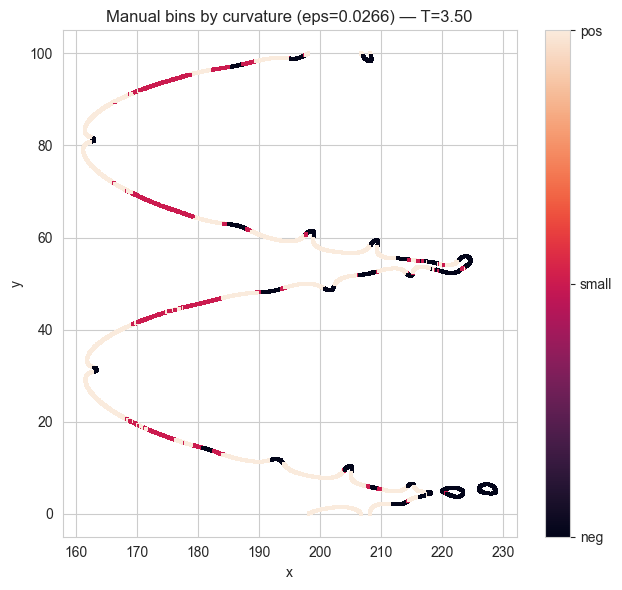

Bin '  neg' | n=   797 | DW_FDS = +8.253e-01 +1.714e-01*curvature -7.772e-02*stretch_rate | R^2=0.545 RMSE=3.587e-01
Bin 'small' | n=   711 | DW_FDS = +1.123e+00 +4.526e+00*curvature -2.795e-01*stretch_rate | R^2=0.038 RMSE=1.708e-01
Bin '  pos' | n=  2045 | DW_FDS = +1.229e+00 -1.375e+00*curvature +3.082e-01*stretch_rate | R^2=0.387 RMSE=2.085e-01


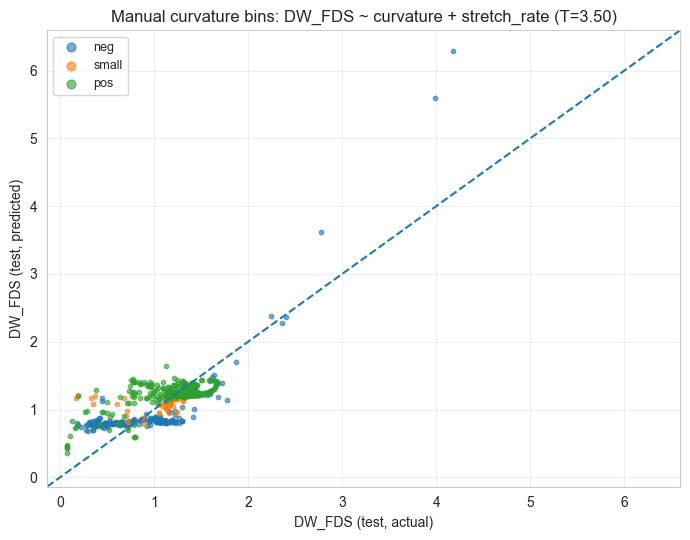

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,3.5,neg,797,0.026563,0.825339,0.171435,-0.077722,0.545466,0.358730
2,3.5,pos,2045,0.026563,1.229053,-1.374781,0.308224,0.386877,0.208515
1,3.5,small,711,0.026563,1.123062,4.525667,-0.279492,0.038131,0.170790



ISOLEVEL T=4.40  |  manual bins by curvature
Small-curvature threshold eps = 0.0248819
curv_bin
pos      2872
neg      2200
small    1269


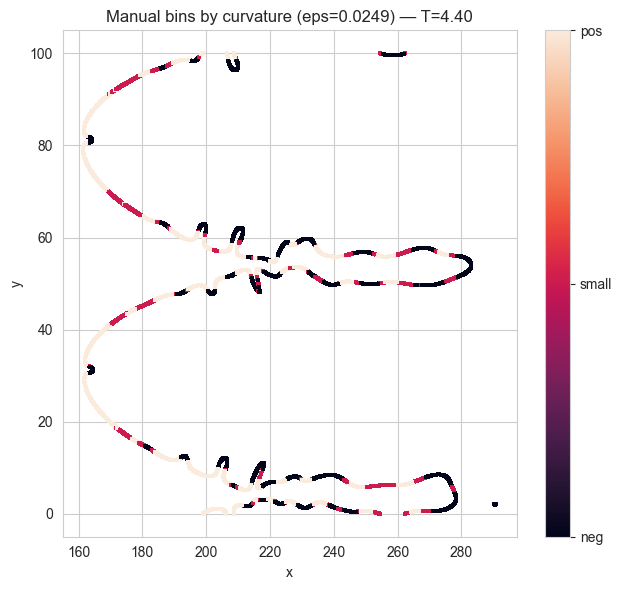

Bin '  neg' | n=  2200 | DW_FDS = +2.203e-01 -3.555e-01*curvature -1.888e-02*stretch_rate | R^2=0.466 RMSE=3.865e-01
Bin 'small' | n=  1269 | DW_FDS = +5.306e-01 +1.509e+01*curvature +2.425e-01*stretch_rate | R^2=0.171 RMSE=5.066e-01
Bin '  pos' | n=  2872 | DW_FDS = +7.909e-01 -1.324e+00*curvature +4.336e-01*stretch_rate | R^2=0.284 RMSE=5.507e-01


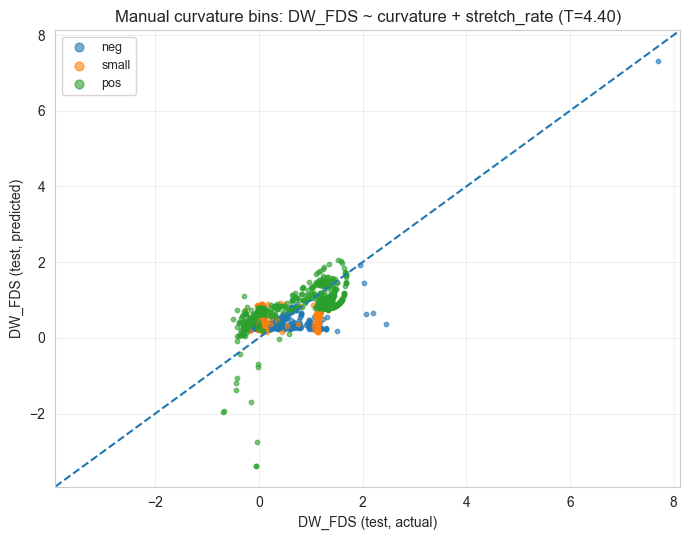

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.4,neg,2200,0.024882,0.220319,-0.355481,-0.018875,0.465549,0.386525
2,4.4,pos,2872,0.024882,0.790858,-1.324367,0.433616,0.283628,0.550674
1,4.4,small,1269,0.024882,0.530553,15.087241,0.242453,0.170617,0.506595



ISOLEVEL T=4.50  |  manual bins by curvature
Small-curvature threshold eps = 0.0200794
curv_bin
pos      3979
neg      3080
small    1765


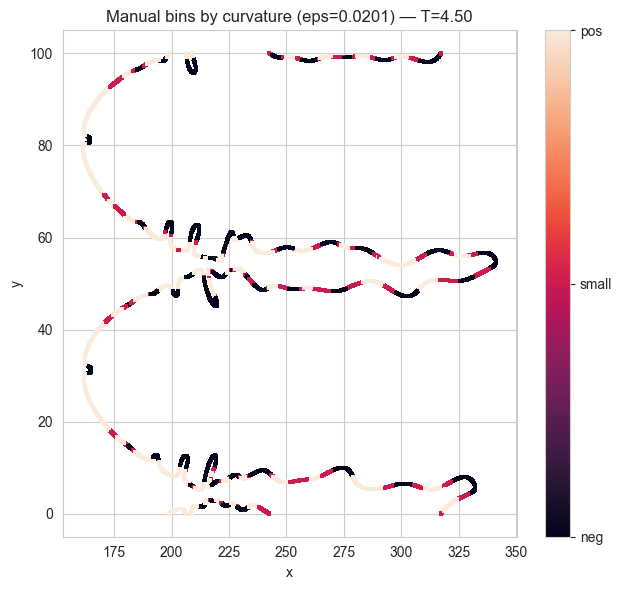

Bin '  neg' | n=  3080 | DW_FDS = +2.090e-01 +5.026e-03*curvature -1.200e-01*stretch_rate | R^2=0.223 RMSE=3.167e-01
Bin 'small' | n=  1765 | DW_FDS = +2.838e-01 +9.849e+00*curvature +4.217e-01*stretch_rate | R^2=0.061 RMSE=4.271e-01
Bin '  pos' | n=  3979 | DW_FDS = +5.563e-01 -3.768e-01*curvature +3.022e-01*stretch_rate | R^2=0.250 RMSE=5.744e-01


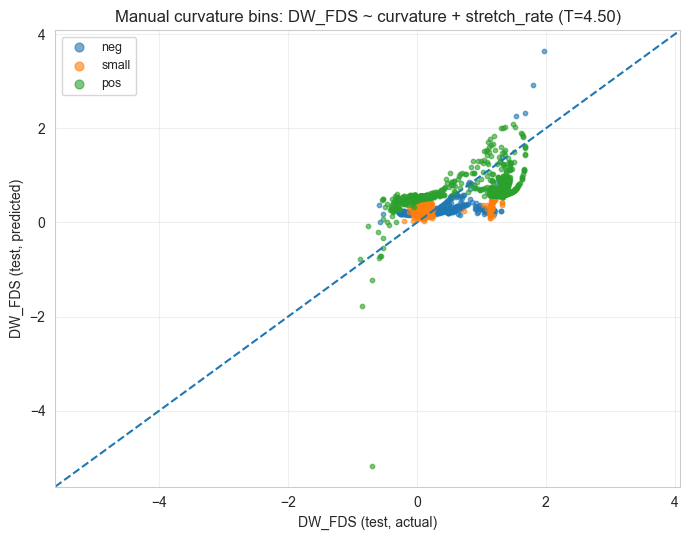

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.5,neg,3080,0.020079,0.208972,0.005026,-0.119981,0.223245,0.316735
2,4.5,pos,3979,0.020079,0.556266,-0.376847,0.302234,0.249623,0.574447
1,4.5,small,1765,0.020079,0.283843,9.848682,0.421700,0.061400,0.427054



ISOLEVEL T=4.60  |  manual bins by curvature
Small-curvature threshold eps = 0.0145111
curv_bin
pos      5152
neg      4118
small    2318


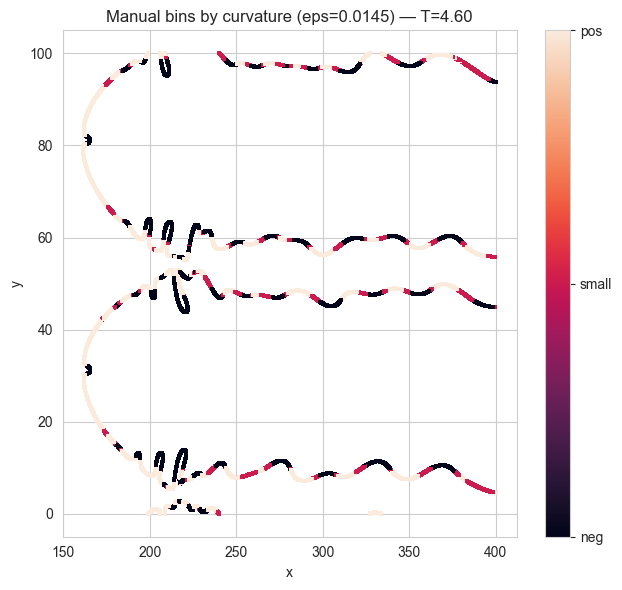

Bin '  neg' | n=  4118 | DW_FDS = +9.871e-02 -2.265e-01*curvature -8.300e-02*stretch_rate | R^2=0.207 RMSE=3.163e-01
Bin 'small' | n=  2318 | DW_FDS = +1.571e-01 +2.712e+00*curvature -5.607e-01*stretch_rate | R^2=-0.006 RMSE=3.441e-01
Bin '  pos' | n=  5152 | DW_FDS = +3.796e-01 +5.451e-01*curvature +4.768e-02*stretch_rate | R^2=0.171 RMSE=6.382e-01


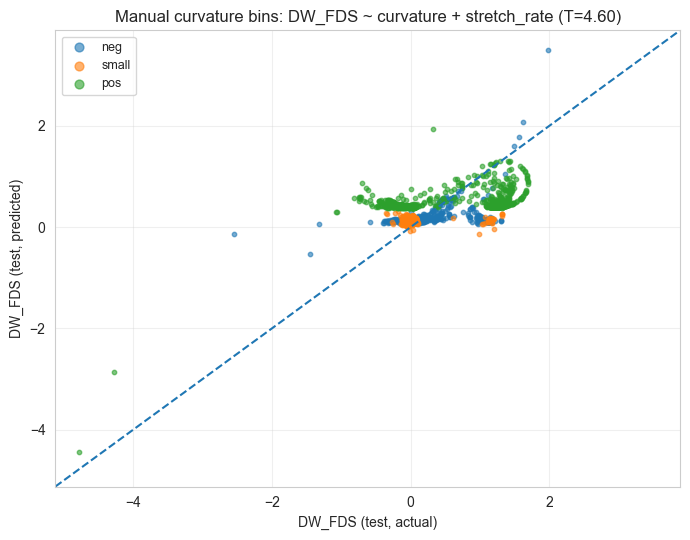

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.6,neg,4118,0.014511,0.098708,-0.226523,-0.083000,0.206799,0.316270
2,4.6,pos,5152,0.014511,0.379552,0.545078,0.047679,0.170630,0.638248
1,4.6,small,2318,0.014511,0.157089,2.711503,-0.560714,-0.005960,0.344066



ISOLEVEL T=4.70  |  manual bins by curvature
Small-curvature threshold eps = 0.0145848
curv_bin
pos      5112
neg      4574
small    2422


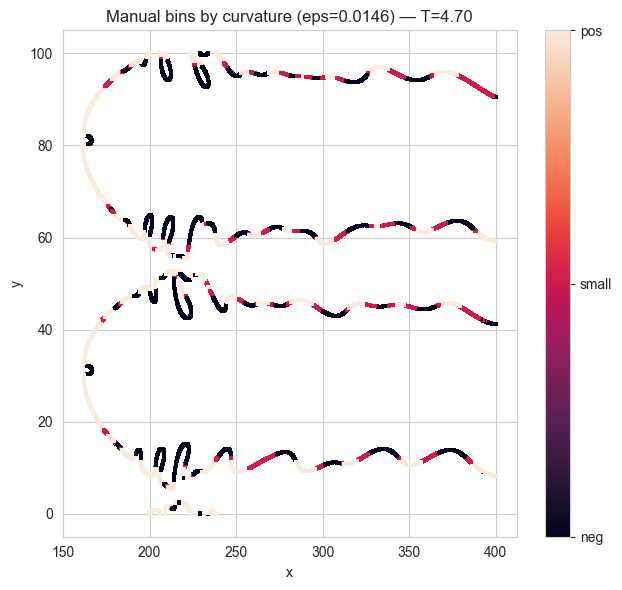

Bin '  neg' | n=  4574 | DW_FDS = +7.487e-02 -1.858e-01*curvature -9.293e-02*stretch_rate | R^2=0.217 RMSE=2.911e-01
Bin 'small' | n=  2422 | DW_FDS = +9.271e-02 +3.834e+00*curvature -6.082e-01*stretch_rate | R^2=0.010 RMSE=3.746e-01
Bin '  pos' | n=  5112 | DW_FDS = +3.414e-01 -5.224e-02*curvature +2.433e-01*stretch_rate | R^2=0.060 RMSE=7.043e-01


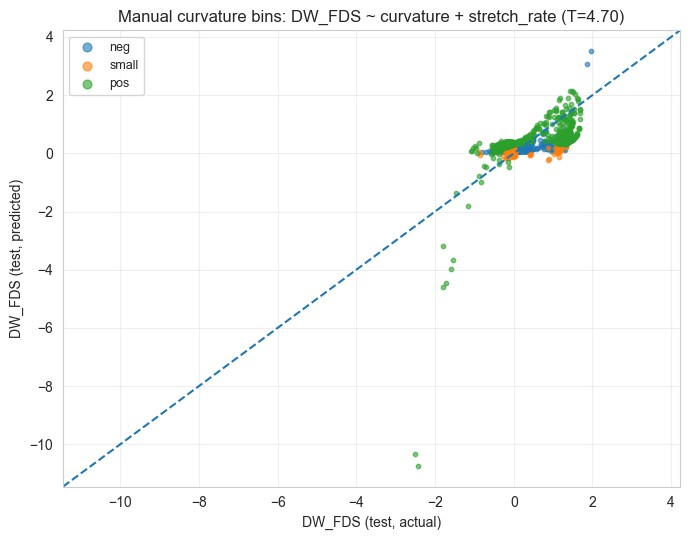

,isolevel,bin,n,eps_small_curvature,intercept,coef_curvature,coef_stretch_rate,r2_test,rmse_test
0,4.7,neg,4574,0.014585,0.074871,-0.185785,-0.092935,0.216729,0.291101
2,4.7,pos,5112,0.014585,0.341427,-0.052238,0.243297,0.059800,0.704262
1,4.7,small,2422,0.014585,0.092712,3.834437,-0.608158,0.009868,0.374567


In [135]:
# ============================================================
# MANUAL "CLUSTERING" BY CURVATURE SIGN / MAGNITUDE
# - Creates 3 bins: NEGATIVE, SMALL (near zero), POSITIVE
# - Then fits per-bin linear model:
#       DW_FDS = a0 + a1*curvature + a2*stretch_rate
# - Works per isolevel (same structure as before)
# ============================================================

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

# -------------------------
# USER SETTINGS
# -------------------------
TARGET = "DW_FDS"
X_FEATURES = ["curvature", "stretch_rate"]
TEST_SIZE = 0.25
RANDOM_STATE = 0
MIN_SAMPLES_PER_BIN = 50

# Define what "small curvature" means.
# Option A (recommended): use a robust threshold from the data distribution.
SMALL_CURV_MODE = "quantile_abs"   # "value" or "quantile_abs"
SMALL_CURV_VALUE = 50.0           # used if SMALL_CURV_MODE="value" (units of curvature)
SMALL_CURV_Q = 0.20               # used if SMALL_CURV_MODE="quantile_abs" (e.g. 0.20 -> middle around 0)

# Bin labels
NEG_LABEL = "neg"
SMALL_LABEL = "small"
POS_LABEL = "pos"


def assign_curvature_bins(curv: np.ndarray, mode: str) -> tuple[np.ndarray, float]:
    """
    Returns:
      labels: array of strings in {neg, small, pos}
      eps: threshold used for small curvature (|kappa| <= eps)
    """
    mode = mode.lower().strip()

    if mode == "value":
        eps = float(SMALL_CURV_VALUE)
    elif mode == "quantile_abs":
        abs_c = np.abs(curv)
        eps = float(np.nanquantile(abs_c, SMALL_CURV_Q))
    else:
        raise ValueError("SMALL_CURV_MODE must be 'value' or 'quantile_abs'.")

    labels = np.empty(curv.shape[0], dtype=object)
    labels[curv < -eps] = NEG_LABEL
    labels[np.abs(curv) <= eps] = SMALL_LABEL
    labels[curv > eps] = POS_LABEL
    return labels, eps


for c_val, front in clustered_fronts.items():
    print(f"\n==============================")
    print(f"ISOLEVEL T={float(c_val):.2f}  |  manual bins by curvature")
    print(f"==============================")

    # checks
    missing = [c for c in (["x", "y"] + X_FEATURES + [TARGET]) if c not in front.columns]
    if missing:
        raise ValueError(f"ISO {c_val}: missing required columns: {missing}")

    df = front.copy()
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=X_FEATURES + [TARGET])
    if len(df) == 0:
        print("No valid rows after cleaning.")
        continue

    # assign manual bins
    curv = df["curvature"].to_numpy(dtype=float)
    labels, eps = assign_curvature_bins(curv, mode=SMALL_CURV_MODE)
    df["curv_bin"] = labels

    print(f"Small-curvature threshold eps = {eps:.6g}")
    print(df["curv_bin"].value_counts().to_string())

    # optional: spatial plot of bins
    plt.figure(figsize=(6.5, 6.0))
    # map bins to ints for coloring
    bin_to_int = {NEG_LABEL: 0, SMALL_LABEL: 1, POS_LABEL: 2}
    c_int = df["curv_bin"].map(bin_to_int).to_numpy()
    plt.scatter(df["x"], df["y"], c=c_int, s=8, marker="s", linewidths=0)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(f"Manual bins by curvature (eps={eps:.3g}) — T={float(c_val):.2f}")
    cb = plt.colorbar(ticks=[0, 1, 2])
    cb.ax.set_yticklabels([NEG_LABEL, SMALL_LABEL, POS_LABEL])
    plt.tight_layout()
    plt.show()

    # fit per bin
    rows = []

    plt.figure(figsize=(7.0, 5.5))
    for b in [NEG_LABEL, SMALL_LABEL, POS_LABEL]:
        sub = df[df["curv_bin"] == b].copy()
        n = len(sub)

        if n < MIN_SAMPLES_PER_BIN:
            print(f"Bin '{b}': skip fit (n={n} < {MIN_SAMPLES_PER_BIN})")
            continue

        X = sub[X_FEATURES].to_numpy(dtype=float)
        y = sub[TARGET].to_numpy(dtype=float)

        Xtr, Xte, ytr, yte = train_test_split(
            X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE
        )

        model = LinearRegression(fit_intercept=True)
        model.fit(Xtr, ytr)

        ypred = model.predict(Xte)
        r2 = float(r2_score(yte, ypred))
        rmse = float(np.sqrt(mean_squared_error(yte, ypred)))

        a0 = float(model.intercept_)
        a1 = float(model.coef_[0])  # curvature
        a2 = float(model.coef_[1])  # stretch_rate

        rows.append({
            "isolevel": float(c_val),
            "bin": b,
            "n": int(n),
            "eps_small_curvature": float(eps),
            "intercept": a0,
            "coef_curvature": a1,
            "coef_stretch_rate": a2,
            "r2_test": r2,
            "rmse_test": rmse,
        })

        print(
            f"Bin '{b:>5s}' | n={n:>6d} | "
            f"DW_FDS = {a0:+.3e} {a1:+.3e}*curvature {a2:+.3e}*stretch_rate | "
            f"R^2={r2:.3f} RMSE={rmse:.3e}"
        )

        plt.scatter(yte, ypred, s=10, alpha=0.6, label=b)

    plt.xlabel("DW_FDS (test, actual)")
    plt.ylabel("DW_FDS (test, predicted)")
    plt.title(f"Manual curvature bins: DW_FDS ~ curvature + stretch_rate (T={float(c_val):.2f})")
    plt.grid(True, alpha=0.3)
    plt.legend(markerscale=2, fontsize=9)

    # 1:1 line
    ax = plt.gca()
    lims = [
        min(ax.get_xlim()[0], ax.get_ylim()[0]),
        max(ax.get_xlim()[1], ax.get_ylim()[1]),
    ]
    plt.plot(lims, lims, linestyle="--")
    plt.xlim(lims)
    plt.ylim(lims)

    plt.tight_layout()
    plt.show()

    if rows:
        results_df = pd.DataFrame(rows).sort_values(["bin"])
        display(results_df)
    else:
        print("No bins had enough samples to fit.")



ISOLEVEL T=3.50 | eps_small_curvature=0.0265633
curv_bin
pos      2045
neg       797
small     711
Bin 'neg' | n=797 | DW_FDS = +8.253e-01 +1.714e-01*curvature -7.772e-02*stretch_rate | R^2=0.545 RMSE=3.587e-01


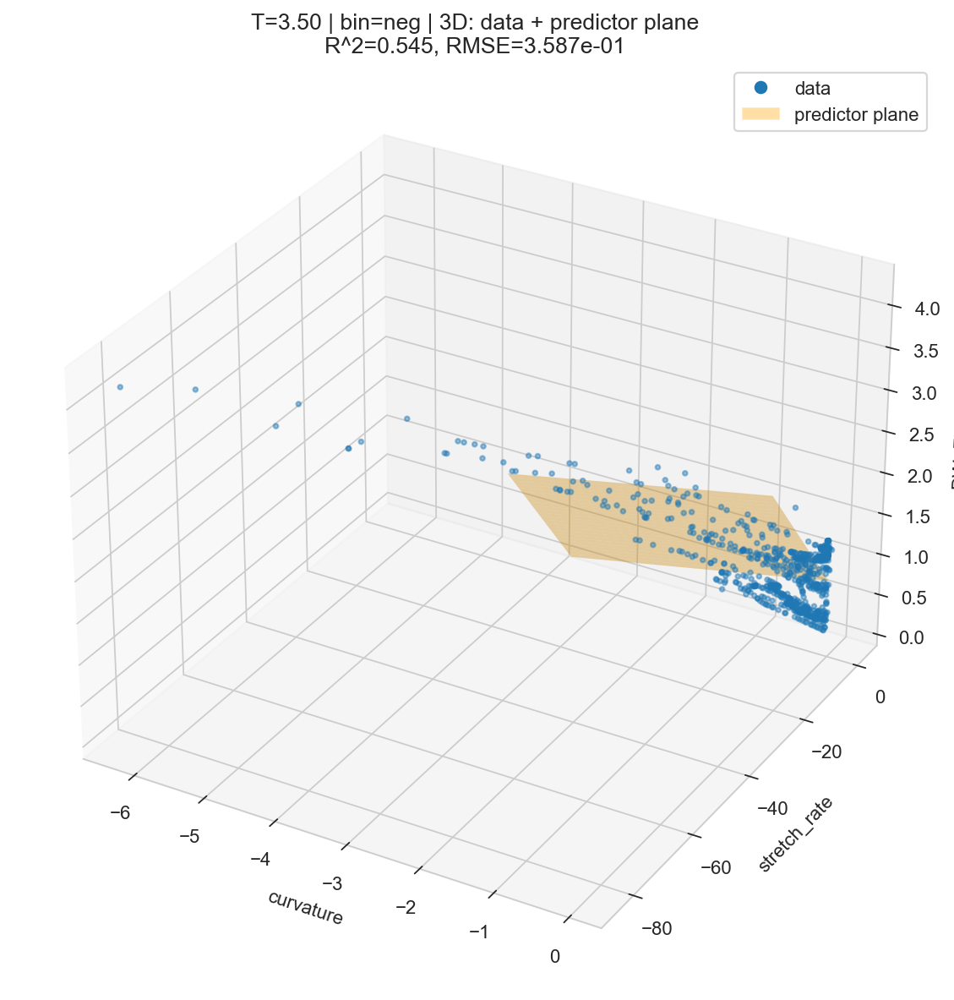

Bin 'small' | n=711 | DW_FDS = +1.123e+00 +4.526e+00*curvature -2.795e-01*stretch_rate | R^2=0.038 RMSE=1.708e-01


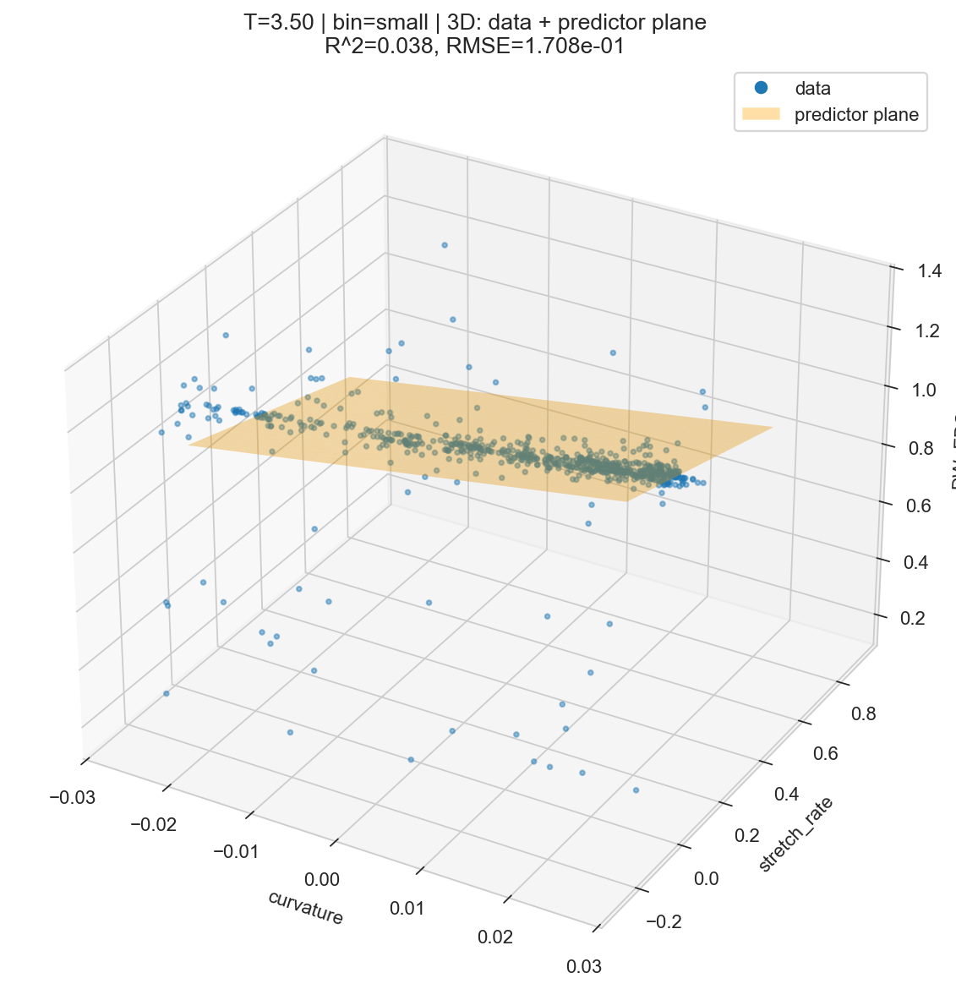

Bin 'pos' | n=2045 | DW_FDS = +1.229e+00 -1.375e+00*curvature +3.082e-01*stretch_rate | R^2=0.387 RMSE=2.085e-01


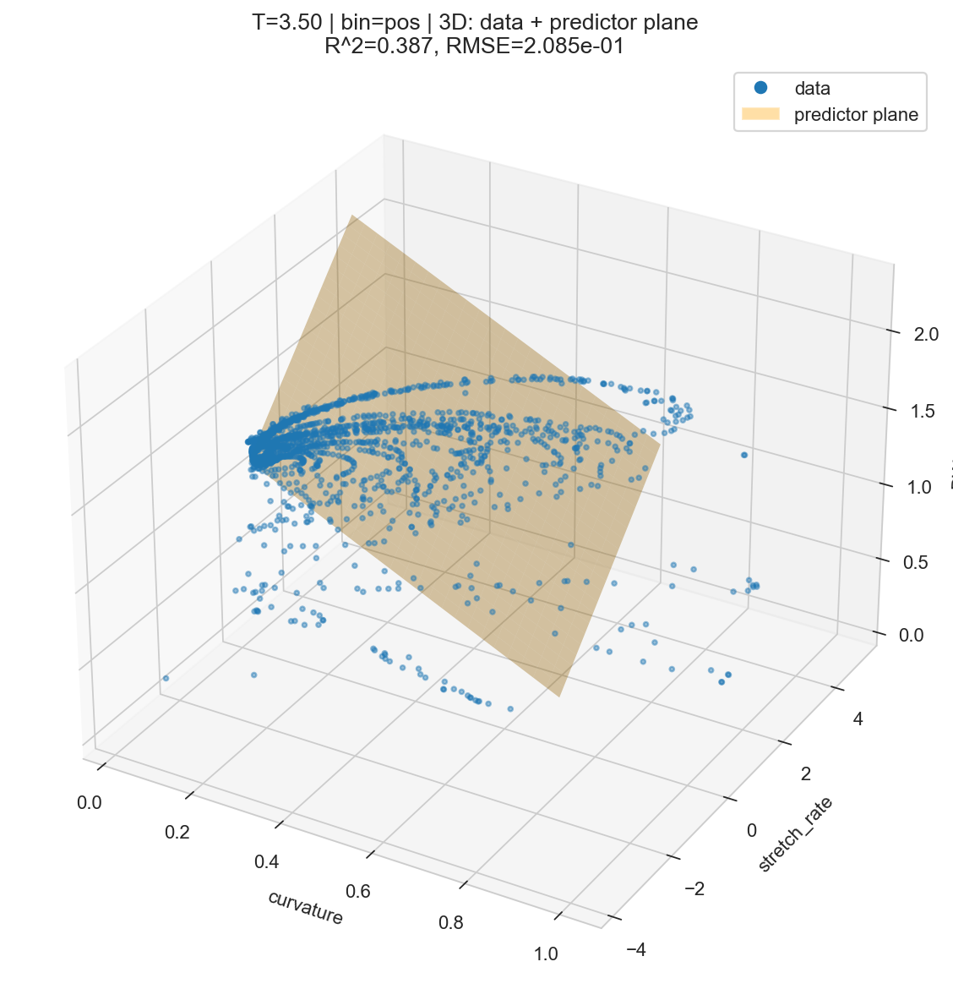


ISOLEVEL T=4.40 | eps_small_curvature=0.0248819
curv_bin
pos      2872
neg      2200
small    1269
Bin 'neg' | n=2200 | DW_FDS = +2.203e-01 -3.555e-01*curvature -1.888e-02*stretch_rate | R^2=0.466 RMSE=3.865e-01


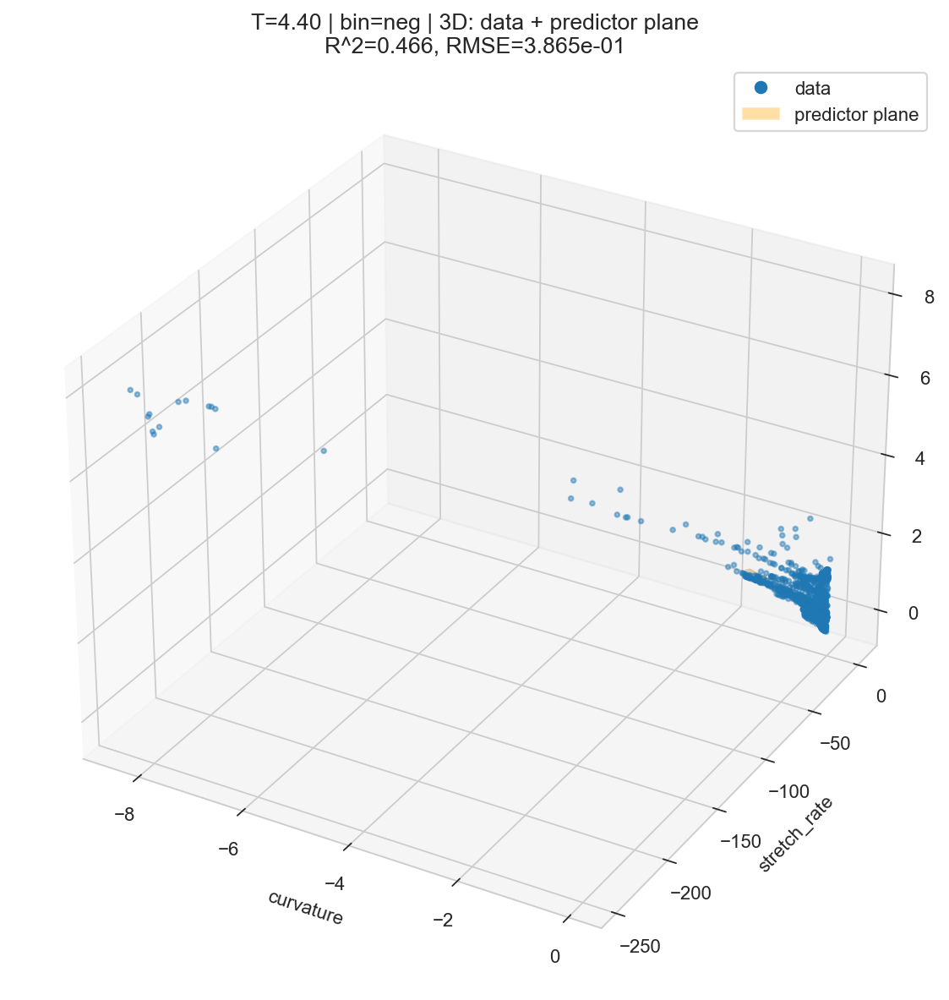

Bin 'small' | n=1269 | DW_FDS = +5.306e-01 +1.509e+01*curvature +2.425e-01*stretch_rate | R^2=0.171 RMSE=5.066e-01


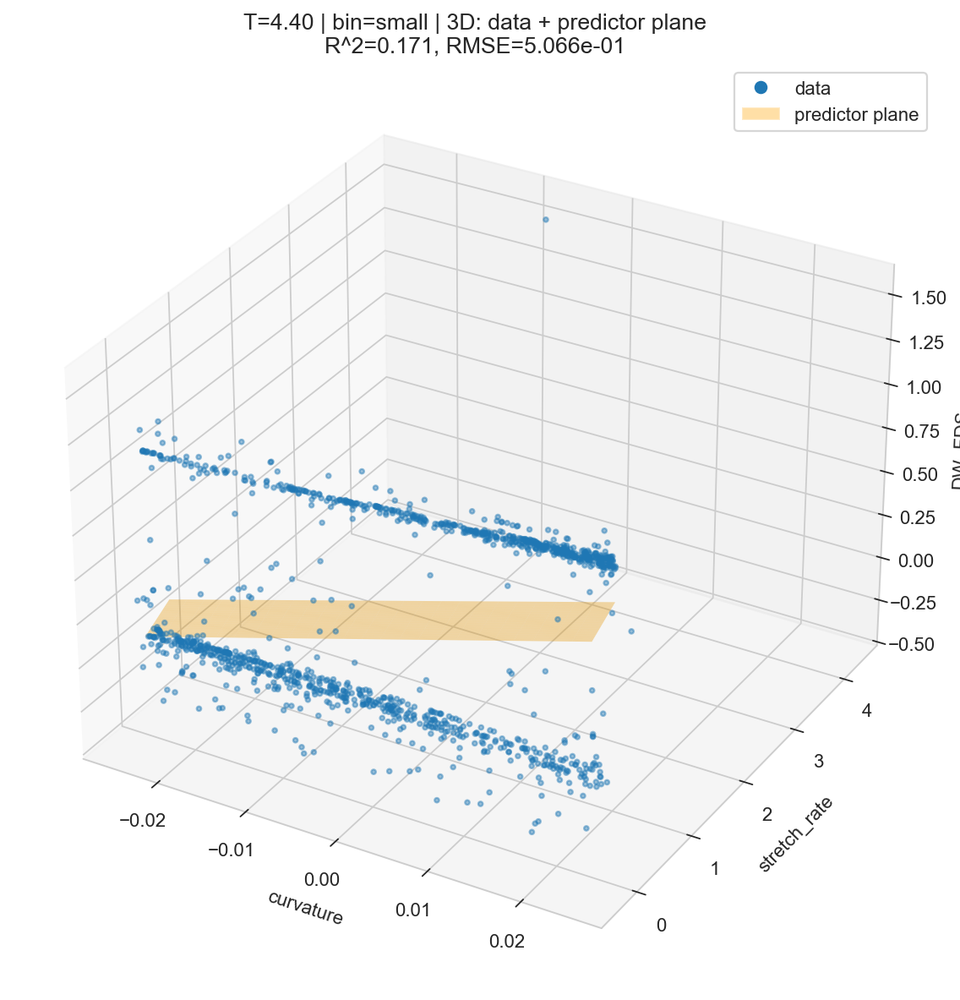

Bin 'pos' | n=2872 | DW_FDS = +7.909e-01 -1.324e+00*curvature +4.336e-01*stretch_rate | R^2=0.284 RMSE=5.507e-01


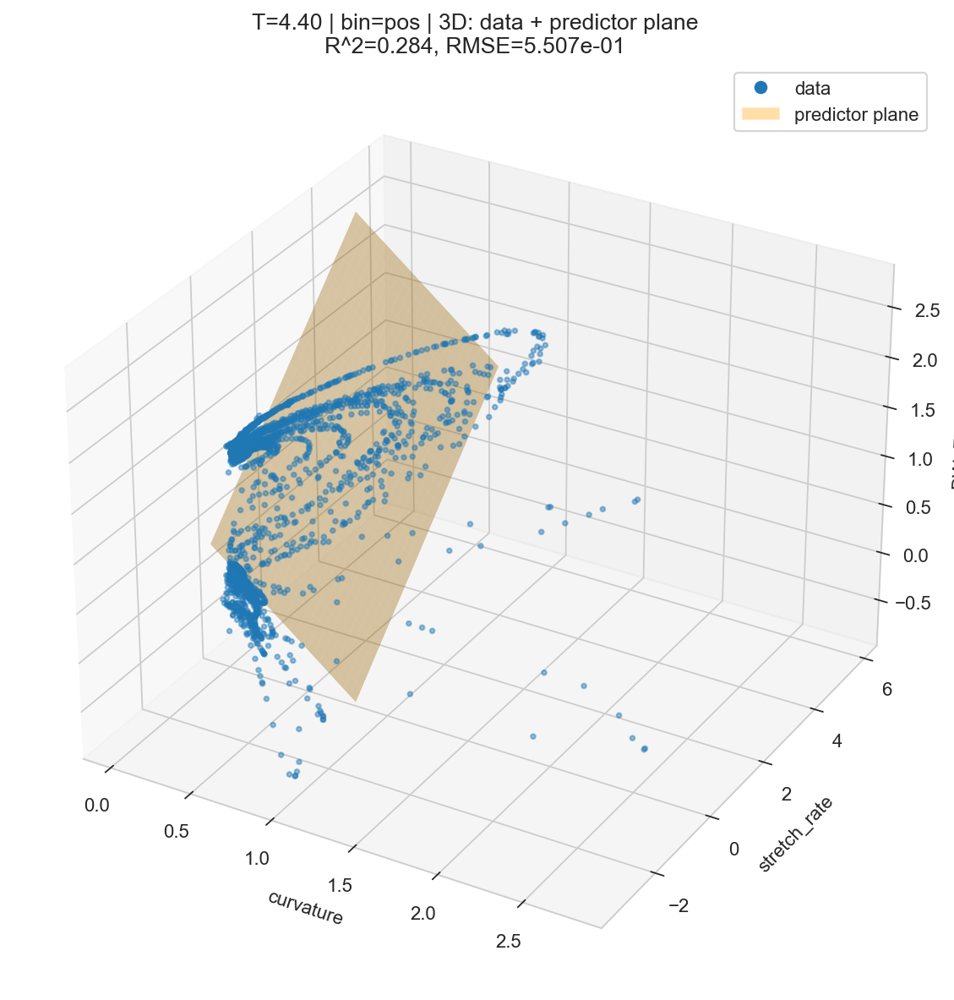


ISOLEVEL T=4.50 | eps_small_curvature=0.0200794
curv_bin
pos      3979
neg      3080
small    1765
Bin 'neg' | n=3080 | DW_FDS = +2.090e-01 +5.026e-03*curvature -1.200e-01*stretch_rate | R^2=0.223 RMSE=3.167e-01


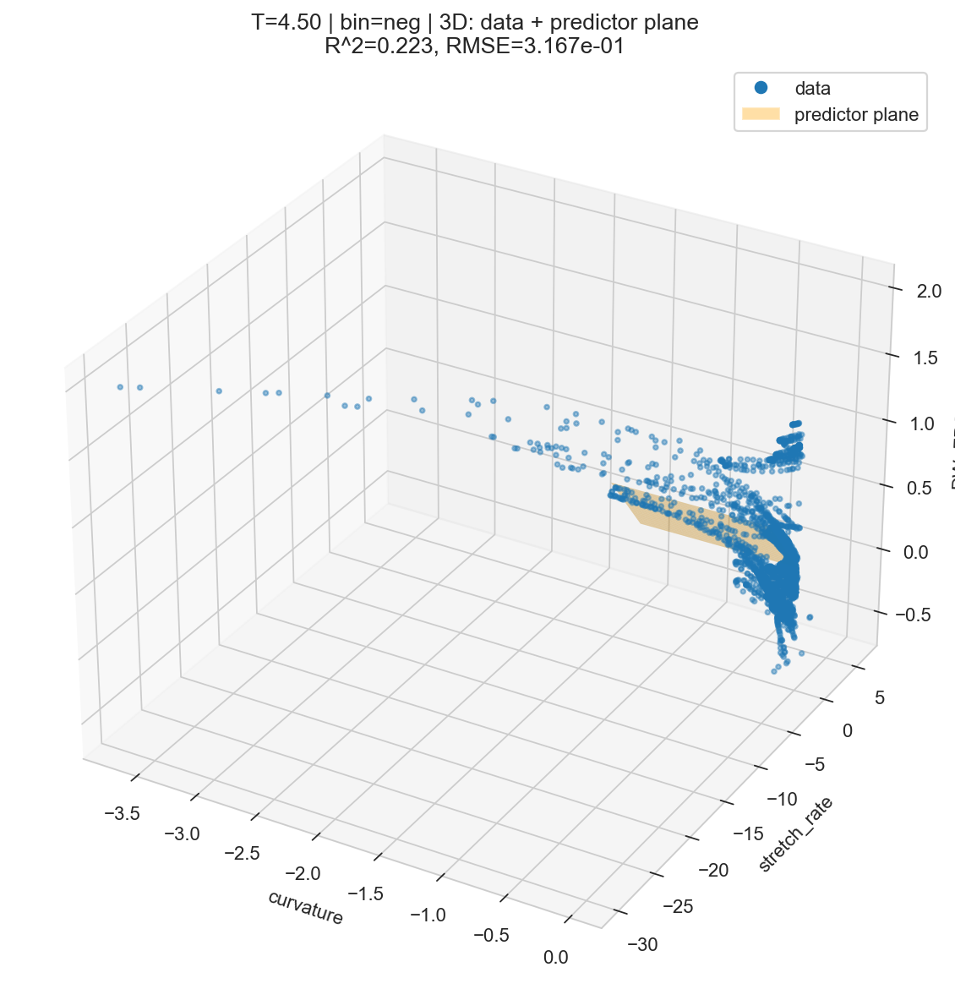

Bin 'small' | n=1765 | DW_FDS = +2.838e-01 +9.849e+00*curvature +4.217e-01*stretch_rate | R^2=0.061 RMSE=4.271e-01


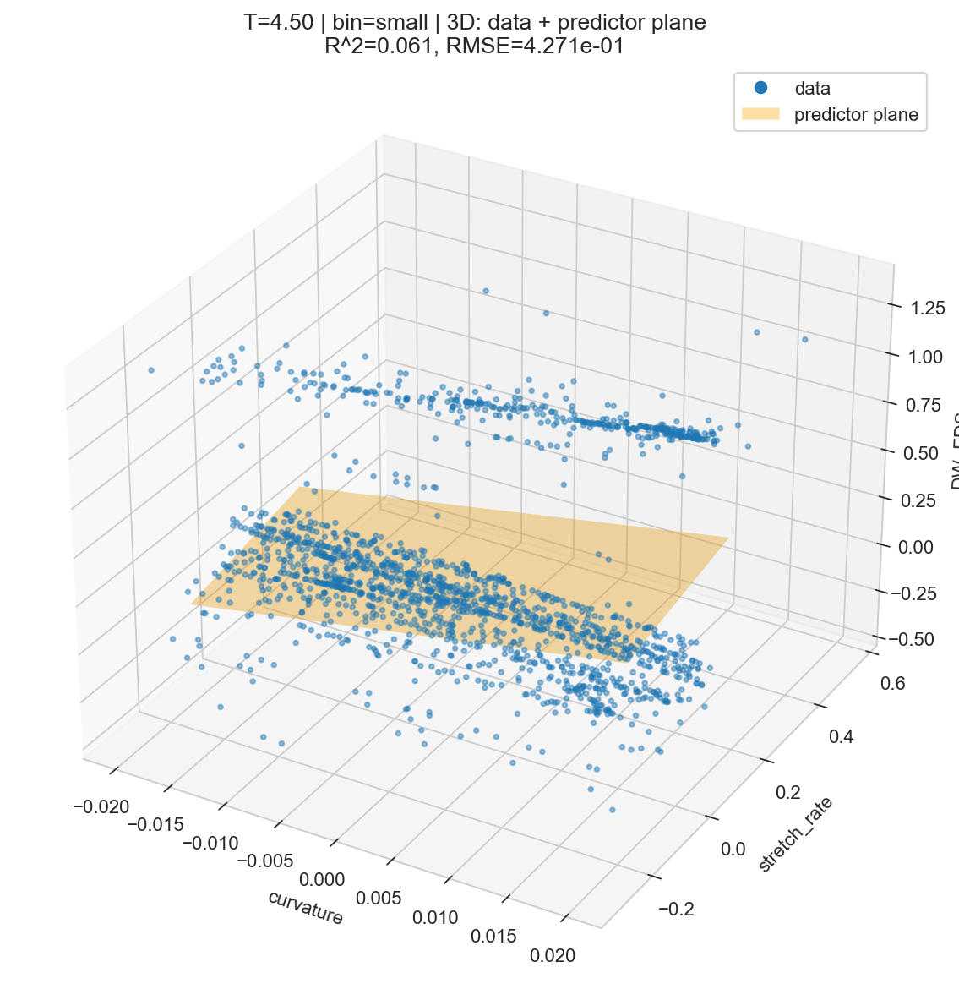

Bin 'pos' | n=3979 | DW_FDS = +5.563e-01 -3.768e-01*curvature +3.022e-01*stretch_rate | R^2=0.250 RMSE=5.744e-01


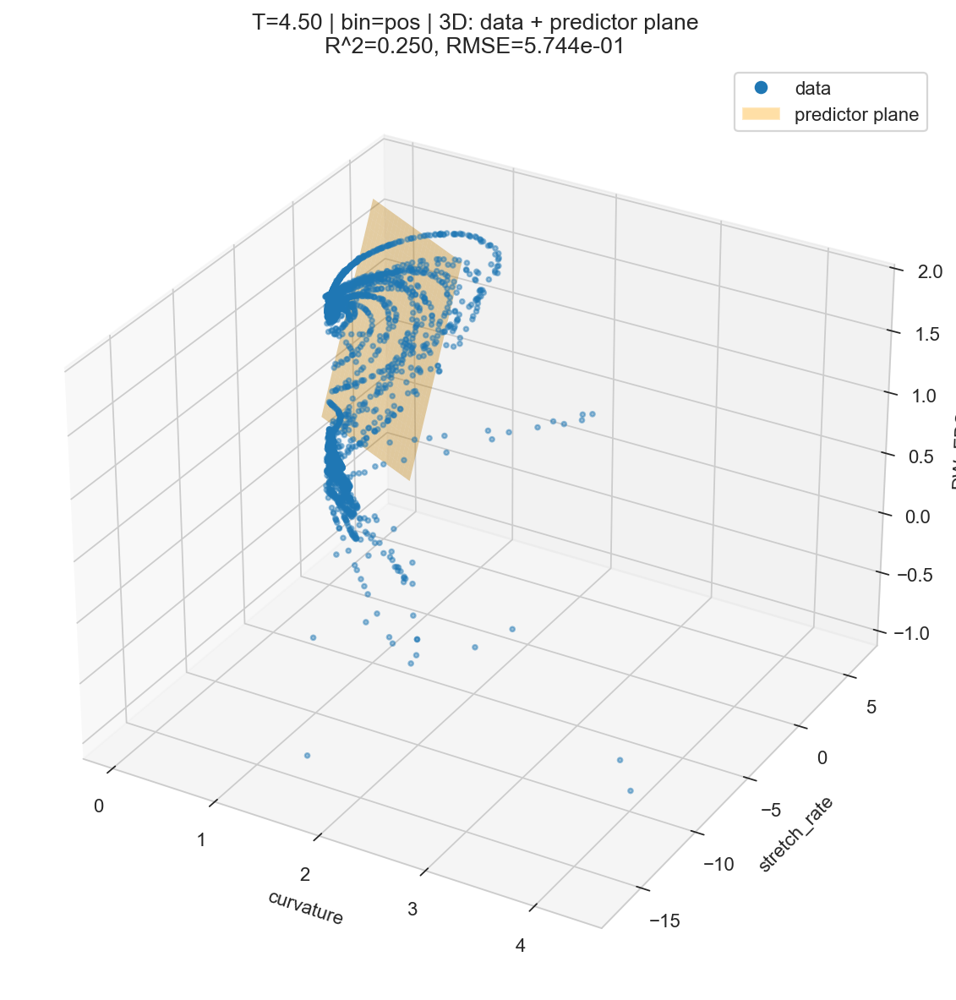


ISOLEVEL T=4.60 | eps_small_curvature=0.0145111
curv_bin
pos      5152
neg      4118
small    2318
Bin 'neg' | n=4118 | DW_FDS = +9.871e-02 -2.265e-01*curvature -8.300e-02*stretch_rate | R^2=0.207 RMSE=3.163e-01


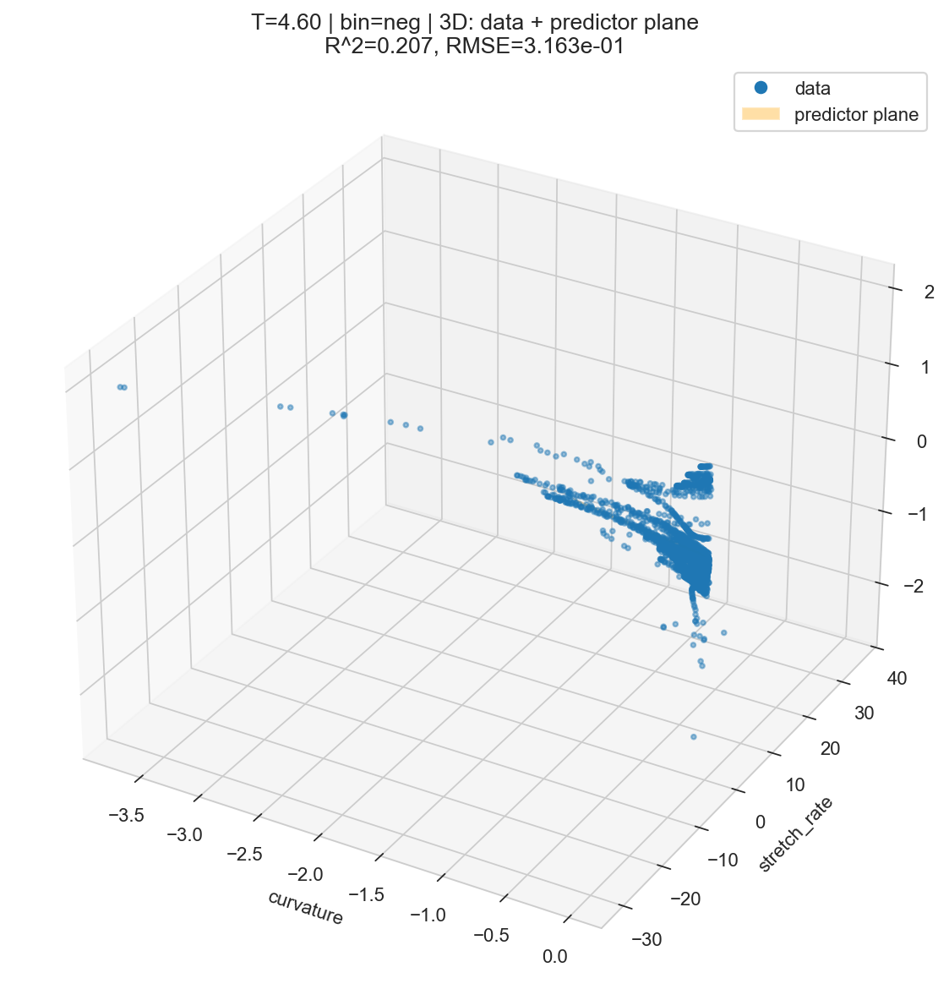

Bin 'small' | n=2318 | DW_FDS = +1.571e-01 +2.712e+00*curvature -5.607e-01*stretch_rate | R^2=-0.006 RMSE=3.441e-01


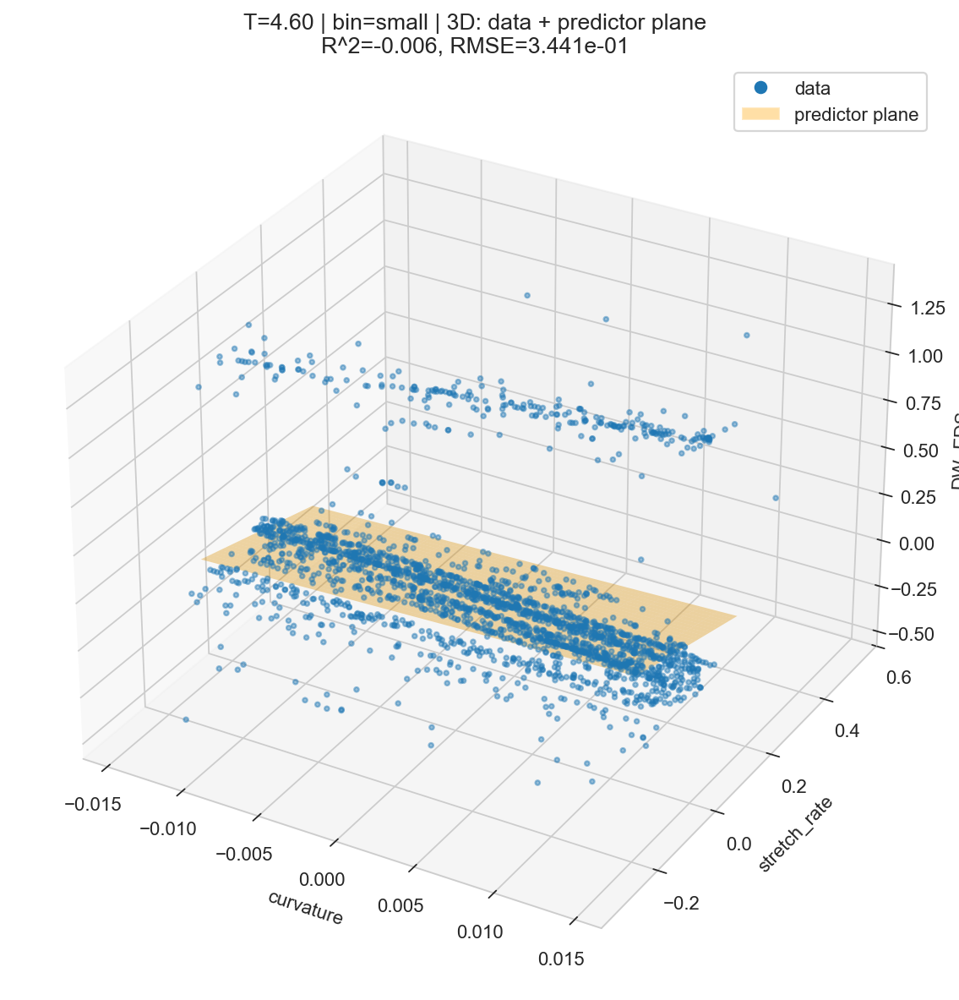

Bin 'pos' | n=5152 | DW_FDS = +3.796e-01 +5.451e-01*curvature +4.768e-02*stretch_rate | R^2=0.171 RMSE=6.382e-01


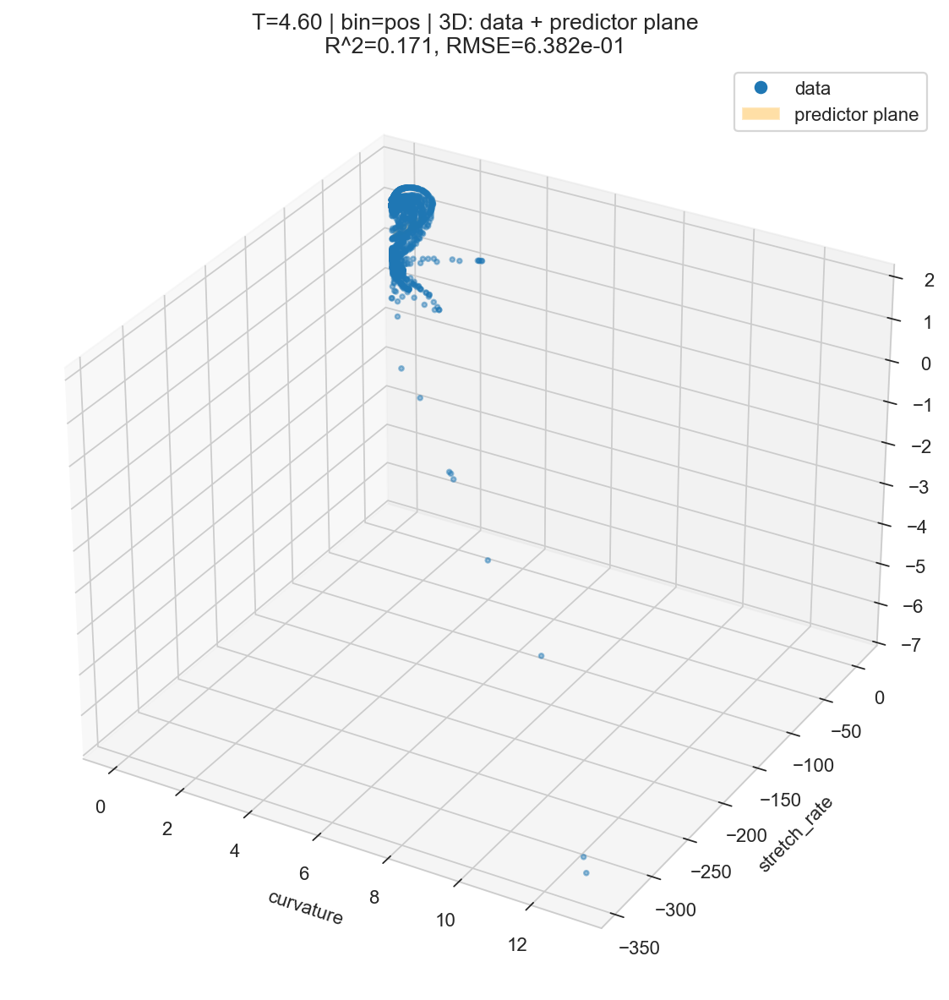


ISOLEVEL T=4.70 | eps_small_curvature=0.0145848
curv_bin
pos      5112
neg      4574
small    2422
Bin 'neg' | n=4574 | DW_FDS = +7.487e-02 -1.858e-01*curvature -9.293e-02*stretch_rate | R^2=0.217 RMSE=2.911e-01


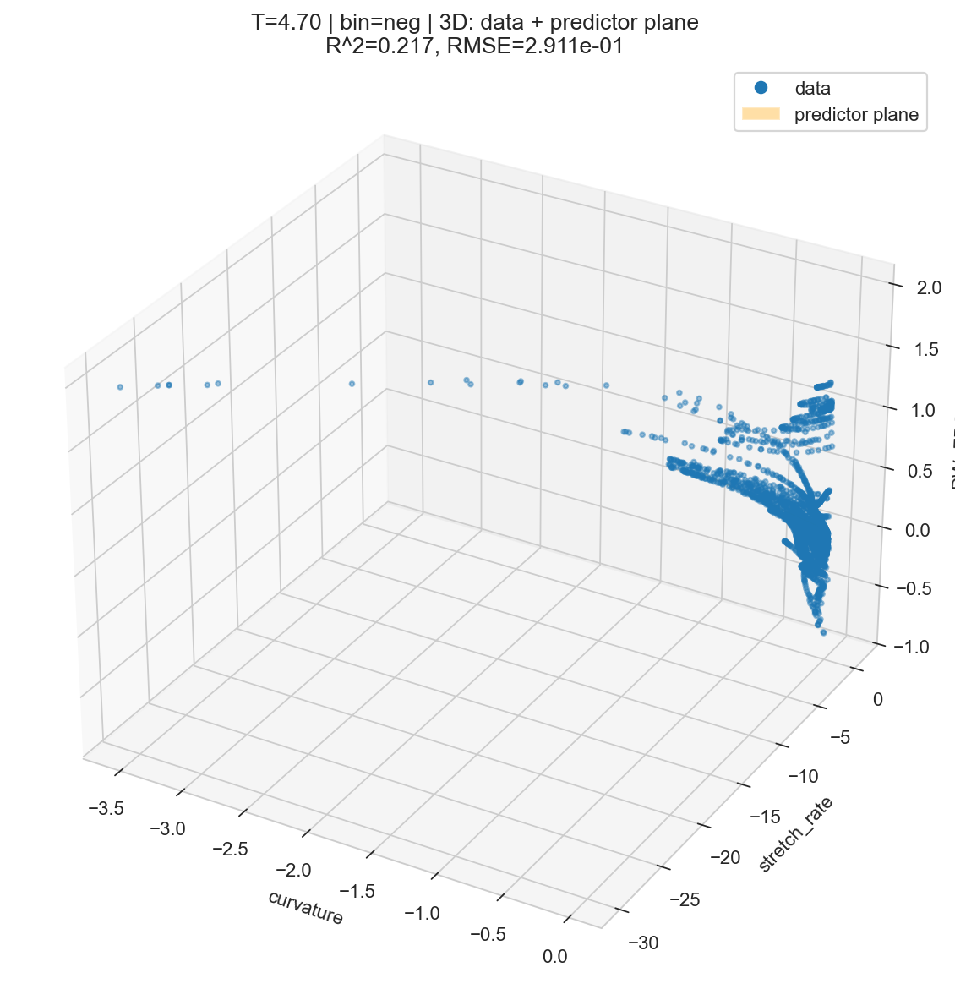

Bin 'small' | n=2422 | DW_FDS = +9.271e-02 +3.834e+00*curvature -6.082e-01*stretch_rate | R^2=0.010 RMSE=3.746e-01


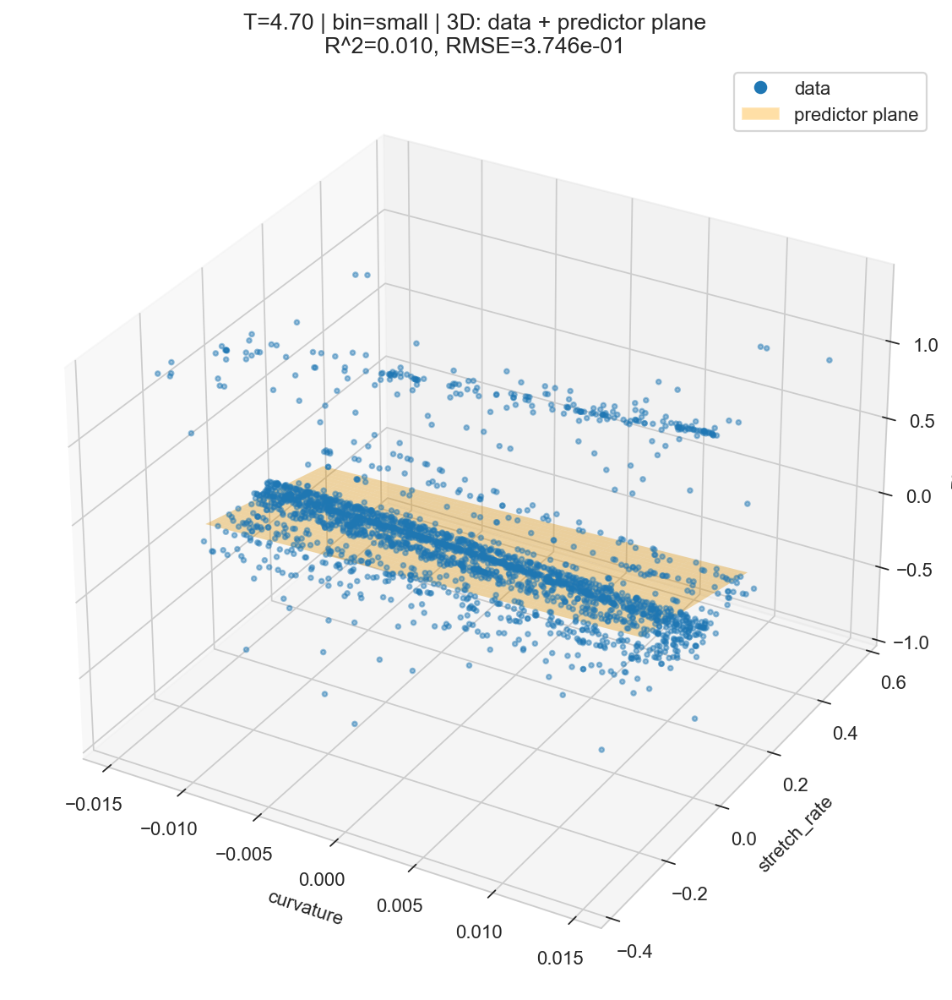

Bin 'pos' | n=5112 | DW_FDS = +3.414e-01 -5.224e-02*curvature +2.433e-01*stretch_rate | R^2=0.060 RMSE=7.043e-01


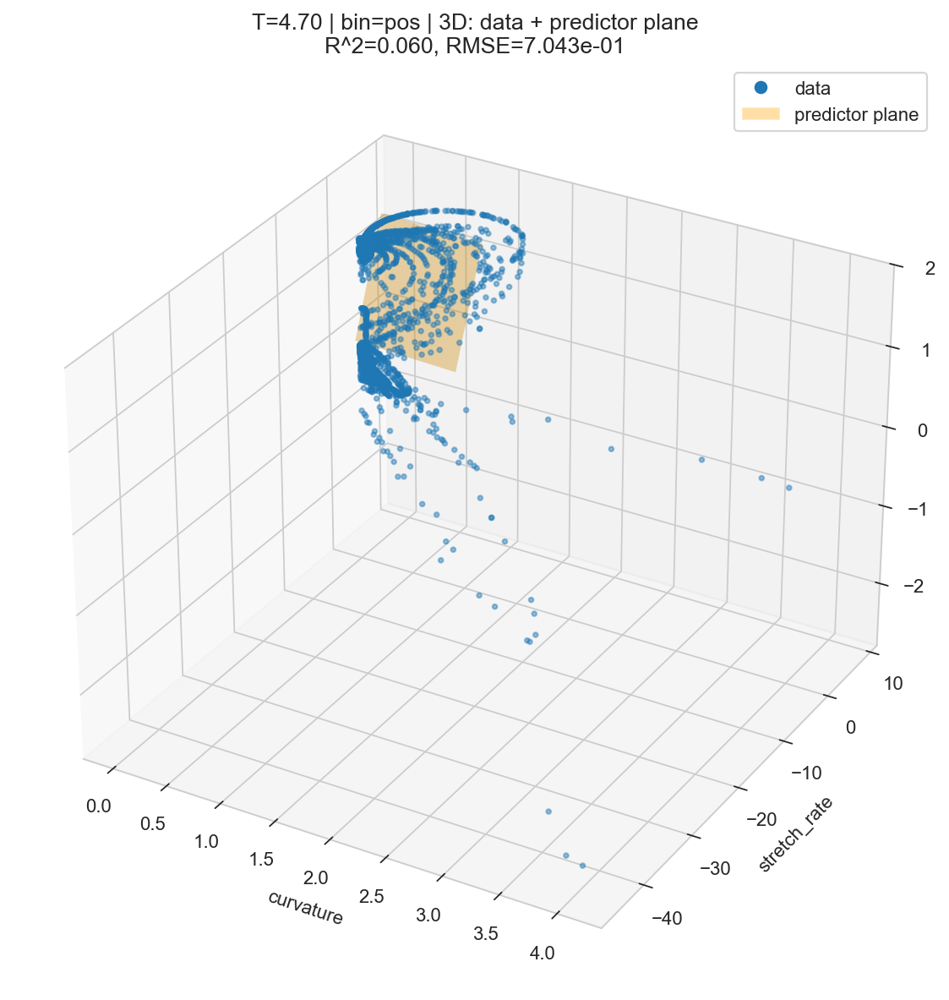

In [130]:
# ============================================================
# 3D PLOT: DW_FDS vs (curvature, stretch_rate) + predictor plane
#   Model: DW_FDS = a0 + a1*curvature + a2*stretch_rate
#
# - Plots 3D scatter of data points in each manual bin
# - Overlays the predictor SURFACE (a plane) as a semi-transparent mesh
# - Surface uses a different color than scatter (default mpl colors)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed for 3D)

# -------------------------
# USER SETTINGS
# -------------------------
TARGET = "DW_FDS"
CURVATURE = "curvature"
STRETCH = "stretch_rate"

TEST_SIZE = 0.25
RANDOM_STATE = 0
MIN_SAMPLES_PER_BIN = 200

# manual bins (reuse your earlier settings)
SMALL_CURV_MODE = "quantile_abs"  # "value" or "quantile_abs"
SMALL_CURV_VALUE = 50.0
SMALL_CURV_Q = 0.20
NEG_LABEL, SMALL_LABEL, POS_LABEL = "neg", "small", "pos"

# plane resolution and downsampling for speed
PLANE_N = 25
MAX_SCATTER_POINTS = 15000  # downsample for plotting speed

def assign_curvature_bins(curv: np.ndarray, mode: str) -> tuple[np.ndarray, float]:
    mode = mode.lower().strip()
    if mode == "value":
        eps = float(SMALL_CURV_VALUE)
    elif mode == "quantile_abs":
        eps = float(np.nanquantile(np.abs(curv), SMALL_CURV_Q))
    else:
        raise ValueError("SMALL_CURV_MODE must be 'value' or 'quantile_abs'.")
    labels = np.empty(curv.shape[0], dtype=object)
    labels[curv < -eps] = NEG_LABEL
    labels[np.abs(curv) <= eps] = SMALL_LABEL
    labels[curv > eps] = POS_LABEL
    return labels, eps


def plot_3d_with_predictor_plane(df_bin: pd.DataFrame, bin_name: str, c_val: float):
    # required columns
    req = [TARGET, CURVATURE, STRETCH]
    missing = [c for c in req if c not in df_bin.columns]
    if missing:
        raise ValueError(f"Bin '{bin_name}': missing columns {missing}")

    dfb = (
        df_bin.replace([np.inf, -np.inf], np.nan)
              .dropna(subset=req)
              .copy()
    )
    n = len(dfb)
    if n < MIN_SAMPLES_PER_BIN:
        print(f"Bin '{bin_name}': skip (n={n} < {MIN_SAMPLES_PER_BIN})")
        return

    # fit model
    X = dfb[[CURVATURE, STRETCH]].to_numpy(dtype=float)
    y = dfb[TARGET].to_numpy(dtype=float)

    Xtr, Xte, ytr, yte = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)
    model = LinearRegression(fit_intercept=True).fit(Xtr, ytr)
    ypred = model.predict(Xte)

    r2 = float(r2_score(yte, ypred))
    rmse = float(np.sqrt(mean_squared_error(yte, ypred)))

    a0 = float(model.intercept_)
    a1 = float(model.coef_[0])
    a2 = float(model.coef_[1])

    print(
        f"Bin '{bin_name}' | n={n} | "
        f"DW_FDS = {a0:+.3e} {a1:+.3e}*curvature {a2:+.3e}*stretch_rate | "
        f"R^2={r2:.3f} RMSE={rmse:.3e}"
    )

    # downsample points for plotting
    if n > MAX_SCATTER_POINTS:
        dfp = dfb.sample(n=MAX_SCATTER_POINTS, random_state=RANDOM_STATE)
    else:
        dfp = dfb

    xc = dfp[CURVATURE].to_numpy(dtype=float)
    xs = dfp[STRETCH].to_numpy(dtype=float)
    yf = dfp[TARGET].to_numpy(dtype=float)

    # build predictor plane grid
    cmin, cmax = np.nanpercentile(xc, 2), np.nanpercentile(xc, 98)
    smin, smax = np.nanpercentile(xs, 2), np.nanpercentile(xs, 98)

    Cg = np.linspace(cmin, cmax, PLANE_N)
    Sg = np.linspace(smin, smax, PLANE_N)
    Cmesh, Smesh = np.meshgrid(Cg, Sg)
    Fmesh = a0 + a1 * Cmesh + a2 * Smesh

    # 3D plot
    fig = plt.figure(figsize=(10.5, 7.5), dpi=160)
    ax = fig.add_subplot(111, projection="3d")

    # scatter (default color)
    ax.scatter(xc, xs, yf, s=6, alpha=0.45, label=f"data ({bin_name})")

    # predictor plane (different color)
    # NOTE: matplotlib requires explicit color for "different colour".
    # If you prefer, set FACE_COLOR = None and use a colormap instead.
    FACE_COLOR = "orange"
    ax.plot_surface(
        Cmesh, Smesh, Fmesh,
        color=FACE_COLOR,
        alpha=0.35,
        linewidth=0,
        antialiased=True,
    )

    ax.set_xlabel("curvature")
    ax.set_ylabel("stretch_rate")
    ax.set_zlabel("DW_FDS")
    ax.set_title(f"T={float(c_val):.2f} | bin={bin_name} | 3D: data + predictor plane\nR^2={r2:.3f}, RMSE={rmse:.3e}")

    # add a proxy legend entry for the plane
    from matplotlib.patches import Patch
    ax.legend(handles=[
        plt.Line2D([0],[0], marker="o", linestyle="", markersize=6, label="data"),
        Patch(facecolor=FACE_COLOR, alpha=0.35, label="predictor plane"),
    ], loc="best")

    plt.tight_layout()
    plt.show()


# -------------------------
# RUN: per isolevel, per manual bin
# -------------------------
for c_val, front in clustered_fronts.items():
    df = front.copy()

    # clean for binning
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[TARGET, CURVATURE, STRETCH])
    if len(df) == 0:
        print(f"ISO {c_val}: no valid rows after cleaning.")
        continue

    labels, eps = assign_curvature_bins(df[CURVATURE].to_numpy(dtype=float), mode=SMALL_CURV_MODE)
    df["curv_bin"] = labels

    print(f"\n==============================")
    print(f"ISOLEVEL T={float(c_val):.2f} | eps_small_curvature={eps:.6g}")
    print(df["curv_bin"].value_counts().to_string())
    print(f"==============================")

    for bin_name in [NEG_LABEL, SMALL_LABEL, POS_LABEL]:
        plot_3d_with_predictor_plane(df[df["curv_bin"] == bin_name], bin_name=bin_name, c_val=float(c_val))


In [119]:
# ============================================================
# INTERACTIVE 3D (PLOTLY): DW_FDS vs (curvature, stretch_rate) + predictor PLANE
#   Model: DW_FDS = a0 + a1*curvature + a2*stretch_rate
#
# - For each manual curvature bin (neg/small/pos):
#     * Fit linear regression
#     * Plot 3D scatter (curvature, stretch_rate, DW_FDS)
#     * Overlay predictor plane as a semi-transparent surface (different color)
#
# Requirements:
#   pip install plotly
# ============================================================

import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

import plotly.graph_objects as go


# -------------------------
# USER SETTINGS
# -------------------------
TARGET = "DW_FDS"
CURVATURE = "curvature"
STRETCH = "stretch_rate"

TEST_SIZE = 0.25
RANDOM_STATE = 0
MIN_SAMPLES_PER_BIN = 200

# manual bins
SMALL_CURV_MODE = "quantile_abs"  # "value" or "quantile_abs"
SMALL_CURV_VALUE = 50.0
SMALL_CURV_Q = 0.20
NEG_LABEL, SMALL_LABEL, POS_LABEL = "neg", "small", "pos"

# plotting settings
MAX_SCATTER_POINTS = 20000     # downsample scatter for speed
PLANE_N = 40                   # plane resolution (higher = smoother, heavier)
SCATTER_MARKER_SIZE = 2


def assign_curvature_bins(curv: np.ndarray, mode: str) -> tuple[np.ndarray, float]:
    mode = mode.lower().strip()
    if mode == "value":
        eps = float(SMALL_CURV_VALUE)
    elif mode == "quantile_abs":
        eps = float(np.nanquantile(np.abs(curv), SMALL_CURV_Q))
    else:
        raise ValueError("SMALL_CURV_MODE must be 'value' or 'quantile_abs'.")
    labels = np.empty(curv.shape[0], dtype=object)
    labels[curv < -eps] = NEG_LABEL
    labels[np.abs(curv) <= eps] = SMALL_LABEL
    labels[curv > eps] = POS_LABEL
    return labels, eps


def plotly_3d_scatter_plus_plane(df_bin: pd.DataFrame, bin_name: str, c_val: float) -> go.Figure | None:
    # required columns
    req = [TARGET, CURVATURE, STRETCH]
    missing = [c for c in req if c not in df_bin.columns]
    if missing:
        raise ValueError(f"Bin '{bin_name}': missing columns {missing}")

    dfb = (
        df_bin.replace([np.inf, -np.inf], np.nan)
              .dropna(subset=req)
              .copy()
    )
    n = len(dfb)
    if n < MIN_SAMPLES_PER_BIN:
        print(f"Bin '{bin_name}': skip (n={n} < {MIN_SAMPLES_PER_BIN})")
        return None

    # fit linear model
    X = dfb[[CURVATURE, STRETCH]].to_numpy(dtype=np.float64)
    y = dfb[TARGET].to_numpy(dtype=np.float64)

    Xtr, Xte, ytr, yte = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)
    model = LinearRegression(fit_intercept=True)
    model.fit(Xtr, ytr)

    ypred = model.predict(Xte)
    r2 = float(r2_score(yte, ypred))
    rmse = float(np.sqrt(mean_squared_error(yte, ypred)))

    a0 = float(model.intercept_)
    a1 = float(model.coef_[0])
    a2 = float(model.coef_[1])

    print(
        f"Bin '{bin_name}' | n={n} | "
        f"DW_FDS = {a0:+.3e} {a1:+.3e}*curvature {a2:+.3e}*stretch_rate | "
        f"R^2={r2:.3f} RMSE={rmse:.3e}"
    )

    # downsample scatter for speed
    if n > MAX_SCATTER_POINTS:
        dfp = dfb.sample(n=MAX_SCATTER_POINTS, random_state=RANDOM_STATE)
    else:
        dfp = dfb

    xc = dfp[CURVATURE].to_numpy(dtype=np.float64)
    xs = dfp[STRETCH].to_numpy(dtype=np.float64)
    yf = dfp[TARGET].to_numpy(dtype=np.float64)

    # plane grid based on robust percentiles of data
    cmin, cmax = np.nanpercentile(xc, 2), np.nanpercentile(xc, 98)
    smin, smax = np.nanpercentile(xs, 2), np.nanpercentile(xs, 98)

    Cg = np.linspace(cmin, cmax, PLANE_N)
    Sg = np.linspace(smin, smax, PLANE_N)
    Cmesh, Smesh = np.meshgrid(Cg, Sg)
    Fmesh = a0 + a1 * Cmesh + a2 * Smesh

    # scatter trace
    scatter = go.Scatter3d(
        x=xc,
        y=xs,
        z=yf,
        mode="markers",
        marker=dict(size=SCATTER_MARKER_SIZE, opacity=0.55),
        name=f"data ({bin_name})",
        hovertemplate=(
            "curv=%{x:.4e}<br>"
            "stretch=%{y:.4e}<br>"
            "DW_FDS=%{z:.4e}<extra></extra>"
        ),
    )

    # plane trace (make it clearly visible)
    plane = go.Surface(
        x=Cg,
        y=Sg,
        z=Fmesh,
        opacity=0.45,
        showscale=False,
        name="predictor plane",
        # explicit colorscale so it is visibly different from the scatter
        colorscale=[[0.0, "rgb(255,140,0)"], [1.0, "rgb(255,140,0)"]],
        hovertemplate=(
            "curv=%{x:.4e}<br>"
            "stretch=%{y:.4e}<br>"
            "pred=%{z:.4e}<extra></extra>"
        ),
    )

    fig = go.Figure(data=[plane, scatter])  # plane first so points appear on top

    fig.update_layout(
        title=f"T={float(c_val):.2f} | bin={bin_name} | data + predictor plane | R²={r2:.3f}, RMSE={rmse:.3e}",
        scene=dict(
            xaxis_title="curvature",
            yaxis_title="stretch_rate",
            zaxis_title="DW_FDS",
        ),
        height=700,
        width=980,
        margin=dict(l=20, r=20, t=60, b=20),
    )

    return fig


# -------------------------
# RUN: per isolevel, per manual bin
# -------------------------
for c_val, front in clustered_fronts.items():
    df = front.copy()

    # clean for binning
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[TARGET, CURVATURE, STRETCH])
    if len(df) == 0:
        print(f"ISO {c_val}: no valid rows after cleaning.")
        continue

    labels, eps = assign_curvature_bins(df[CURVATURE].to_numpy(dtype=np.float64), mode=SMALL_CURV_MODE)
    df["curv_bin"] = labels

    print(f"\n==============================")
    print(f"ISOLEVEL T={float(c_val):.2f} | eps_small_curvature={eps:.6g}")
    print(df["curv_bin"].value_counts().to_string())
    print(f"==============================")

    for bin_name in [NEG_LABEL, SMALL_LABEL, POS_LABEL]:
        fig = plotly_3d_scatter_plus_plane(
            df[df["curv_bin"] == bin_name],
            bin_name=bin_name,
            c_val=float(c_val),
        )
        if fig is not None:
            fig.show()



ISOLEVEL T=4.50 | eps_small_curvature=0.0200794
curv_bin
pos      3979
neg      3080
small    1765
Bin 'neg' | n=3080 | DW_FDS = +2.090e-01 +5.026e-03*curvature -1.200e-01*stretch_rate | R^2=0.223 RMSE=3.167e-01


Bin 'small' | n=1765 | DW_FDS = +2.838e-01 +9.849e+00*curvature +4.217e-01*stretch_rate | R^2=0.061 RMSE=4.271e-01


Bin 'pos' | n=3979 | DW_FDS = +5.563e-01 -3.768e-01*curvature +3.022e-01*stretch_rate | R^2=0.250 RMSE=5.744e-01



ISOLEVEL T=4.60 | eps_small_curvature=0.0145111
curv_bin
pos      5152
neg      4118
small    2318
Bin 'neg' | n=4118 | DW_FDS = +9.871e-02 -2.265e-01*curvature -8.300e-02*stretch_rate | R^2=0.207 RMSE=3.163e-01


Bin 'small' | n=2318 | DW_FDS = +1.571e-01 +2.712e+00*curvature -5.607e-01*stretch_rate | R^2=-0.006 RMSE=3.441e-01


Bin 'pos' | n=5152 | DW_FDS = +3.796e-01 +5.451e-01*curvature +4.768e-02*stretch_rate | R^2=0.171 RMSE=6.382e-01
